In [6]:
import glob
from warnings import simplefilter
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import seaborn as sns
from tqdm.notebook import tqdm

simplefilter(action="ignore", category=pd.errors.PerformanceWarning)

In [7]:
COLOR_STARS = '#e1be6a'
COLOR_AGN = '#40b0a6'

In [60]:
def clean_cloudy_line_file(filename, name='emissivity'):
    '''
    My method for making cloudy line emissivity files more user friendly. 
    To pull emissivities for a given line from each grid step, 
    read in the df and use df.loc['HE_2_1640.00A'] format. 
    '''
    df = pd.read_csv(filename, sep='\t+', header=0, names=[name], comment='#', engine='python')
    df = df[df.index.str.contains('iteration') == False]
    df.index = df.index.str.replace('  ', '_')
    df.index = df.index.str.replace(' ', '_')
    df.index = df.index.str[:-1]
    
    return df

def ohno_backhaus_2022(logneiiioii):
	'''
	defining the unv087 dividing line from Backhaus et al. 2021.
	Singularity at log(NeIII/OII) = 0.285
	'''    
	return 0.35/(2.8*logneiiioii - 0.8) + 0.64


def plot_ohno_backhaus_2022(ax, label=True):
    xohno = np.linspace(-2,0.285, 1000)
    ax.plot(xohno, ohno_backhaus_2022(xohno), c='black', ls='-', lw=3, label='Backhaus et al. 2022' if label else None, zorder=-9)
  

def bpt_kewley_2001(logniiha):
	'''
	Defining the BPT AGN/SF dividing line from Kewley 2001.
	'''    
	return 0.61/(logniiha - 0.47) + 1.19   

def plot_bpt_kewley_2001(ax, label=True, lw=3):
    x = np.linspace(-2,0.46, 1000)
    ax.plot(x, bpt_kewley_2001(x), c='black', ls='-', lw=lw, label='Kewley et al. 2001' if label else None, zorder=-9)
    

def bpt_kauffmann_2003(logniiha):
	'''
	Defining the BPT AGN/SF dividing line from Kauffmann 2003.
	'''    
	return 0.61/(logniiha - 0.05) + 1.3    

    
def plot_bpt_kauffmann_2003(ax, label=True, lw=3):
    x = np.linspace(-2,0.04, 1000)
    ax.plot(x, bpt_kauffmann_2003(x), c='black', ls='--', lw=lw, label='Kauffmann et al. 2003' if label else None, zorder=-9)

def vo87_trump_2015(logsiiha):
	'''
	Defining the unVO87 AGN/SF dividing line from Trump et al. 2015.
	Singularity at log(SII/Ha) = 0.0917
	'''    
	return 0.48/(1.09*logsiiha - 0.10) + 1.3    


def plot_vo87_trump_2015(ax, label=True):
    x = np.linspace(-2,0.09, 1000)
    ax.plot(x, vo87_trump_2015(x), c='black', ls='-', lw=3, label= 'Trump et al. 2015' if label else None, zorder=-9)
	

In [3]:
BPASS_solar_path = "/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/BPASS/solar_abundances/"

catalog = pd.DataFrame()
for ilin in tqdm(glob.glob(f"{BPASS_solar_path}**/**/**.ilin")):
    parameters = ilin.replace(BPASS_solar_path, '').replace('.ilin', '')
    try:
        catalog[parameters] = clean_cloudy_line_file(ilin, name=parameters).copy()
    except:
        print(ilin)
        pass

linesdf = catalog.T
linesdf['logU'] = None
linesdf['zgas'] = None
linesdf['hden'] = None
linesdf['zstar'] = None
linesdf['age'] = None
linesdf['sed'] = None

for id, row in linesdf.iterrows():
    logU = float(id.rsplit('logU')[-1])
    zgas = float(id.replace(f'_logU{logU}', '').rsplit('z')[-1])
    hden = int(id.replace(f'_z{zgas}_logU{logU}', '').rsplit('hden')[-1])
    zstar = float(id.replace(f'_hden{hden}_z{zgas}_logU{logU}', '').rsplit('zstar')[-1])
    age = float(id.replace(f'_zstar{zstar}_hden{hden}_z{zgas}_logU{logU}', '').rsplit('age')[-1])
    sed = str(id.replace(f'_age{age}_zstar{zstar}_hden{hden}_z{zgas}_logU{logU}', '').rsplit('sed')[-1])
    linesdf.loc[id, 'logU'] = logU
    linesdf.loc[id, 'zgas'] = zgas
    linesdf.loc[id, 'hden'] = hden
    linesdf.loc[id, 'zstar'] = zstar
    linesdf.loc[id, 'age'] = age
    linesdf.loc[id, 'sed'] = sed

linesdf


  0%|          | 0/72657 [00:00<?, ?it/s]

/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/BPASS/solar_abundances/hden3/BPASSv2.2.1_imf170_300_burst_binary_models/sedBPASSv2.2.1_imf170_300_burst_binary.ascii_age11.0_zstar0.05_hden3_z0.05_logU-2.25.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/BPASS/solar_abundances/hden3/BPASSv2.2.1_imf170_300_burst_binary_models/sedBPASSv2.2.1_imf170_300_burst_binary.ascii_age11.0_zstar0.05_hden3_z0.05_logU-1.75.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/BPASS/solar_abundances/hden3/BPASSv2.2.1_imf170_300_burst_binary_models/sedBPASSv2.2.1_imf170_300_burst_binary.ascii_age11.0_zstar0.05_hden3_z0.05_logU-2.5.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/BPASS/solar_abundances/hden3/BPASSv2.2.1_imf170_300_burst_binary_models/sedBPASSv2.2.1_imf170_300_burst_binary.ascii_age11.0_zstar0.05_hden3_z0.05_logU-1.25.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_m

,N_4_765.147A,N_3_991.000A,C_3_977.020A,C_2_904.142A,C_2_1036.34A,C_2_1037.02A,S_4_1062.66A,H_1_1215.68A,N_5_1238.82A,N_5_1242.80A,...,O_3_1666.15A,O_5_1218.34A,si_3_1892.03A,BLND_2335.00A,logU,zgas,hden,zstar,age,sed
hden3/BPASSv2.2.1_imf170_300_burst_binary_models/sedBPASSv2.2.1_imf170_300_burst_binary.ascii_age7.1_zstar0.1_hden3_z0.1_logU-2.75,4.609400e-05,8.455600e-06,0.003117,1.185800e-04,9.388400e-04,0.001190,1.126800e-04,0.823320,1.150800e-07,5.956600e-08,...,1.757200e-03,4.460600e-10,0.004202,0.001004,-2.75,0.1,3,0.1,7.1,BPASSv2.2.1_imf170_300_burst_binary.ascii
hden3/BPASSv2.2.1_imf170_300_burst_binary_models/sedBPASSv2.2.1_imf170_300_burst_binary.ascii_age6.1_zstar0.4_hden3_z0.4_logU-3.75,1.747100e-09,8.054900e-10,0.000031,1.427100e-05,1.760400e-05,0.000022,2.816100e-09,0.058002,0.000000e+00,0.000000e+00,...,7.833200e-07,0.000000e+00,0.000027,0.000177,-3.75,0.4,3,0.4,6.1,BPASSv2.2.1_imf170_300_burst_binary.ascii
hden3/BPASSv2.2.1_imf170_300_burst_binary_models/sedBPASSv2.2.1_imf170_300_burst_binary.ascii_age7.2_zstar2.0_hden3_z2.0_logU-1.25,1.269500e-03,1.661200e-02,0.038420,2.014700e-03,1.379200e-02,0.016849,1.904100e-02,1.094000,1.665900e-03,8.743800e-04,...,6.083600e-03,2.841500e-09,0.010749,0.006899,-1.25,2.0,3,2.0,7.2,BPASSv2.2.1_imf170_300_burst_binary.ascii
hden3/BPASSv2.2.1_imf170_300_burst_binary_models/sedBPASSv2.2.1_imf170_300_burst_binary.ascii_age7.8_zstar0.05_hden3_z0.05_logU-2.0,3.519800e-04,1.406100e-04,0.039419,5.035800e-04,1.736400e-02,0.022059,1.149800e-02,3.939400,3.767800e-06,1.998000e-06,...,2.284800e-02,1.557700e-09,0.031694,0.001777,-2.0,0.05,3,0.05,7.8,BPASSv2.2.1_imf170_300_burst_binary.ascii
hden3/BPASSv2.2.1_imf170_300_burst_binary_models/sedBPASSv2.2.1_imf170_300_burst_binary.ascii_age6.9_zstar0.5_hden3_z0.5_logU-3.75,7.905100e-09,3.739600e-09,0.000144,1.711300e-05,8.910000e-05,0.000112,3.836100e-08,0.066223,0.000000e+00,0.000000e+00,...,1.493900e-06,0.000000e+00,0.000022,0.000211,-3.75,0.5,3,0.5,6.9,BPASSv2.2.1_imf170_300_burst_binary.ascii
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hden2/BPASSv2.2.1_imf100_300_burst_binary_models/sedBPASSv2.2.1_imf100_300_burst_binary.ascii_age6.6_zstar0.0005_hden2_z0.0005_logU-1.0,1.295400e-03,1.396900e-05,0.004587,2.149500e-05,9.575700e-05,0.000198,3.915700e-04,4.634100,8.152500e-07,4.286900e-07,...,2.104600e-03,1.055500e-07,0.000144,0.000005,-1.0,0.0005,2,0.0005,6.6,BPASSv2.2.1_imf100_300_burst_binary.ascii
hden2/BPASSv2.2.1_imf100_300_burst_binary_models/sedBPASSv2.2.1_imf100_300_burst_binary.ascii_age8.5_zstar0.005_hden2_z0.005_logU-1.25,8.493500e-04,4.825900e-05,0.034205,2.433400e-04,3.686800e-02,0.043710,7.904100e-02,2.561400,5.009900e-03,3.176600e-03,...,5.036200e-03,7.495300e-06,0.003859,0.000070,-1.25,0.005,2,0.005,8.5,BPASSv2.2.1_imf100_300_burst_binary.ascii
hden2/BPASSv2.2.1_imf100_300_burst_binary_models/sedBPASSv2.2.1_imf100_300_burst_binary.ascii_age6.7_zstar0.15_hden2_z0.15_logU-2.0,7.961500e-05,3.277300e-05,0.001362,9.033500e-05,1.306900e-04,0.000232,5.177500e-05,0.249730,1.434200e-07,8.408900e-08,...,1.600100e-03,2.054800e-10,0.002781,0.000298,-2.0,0.15,2,0.15,6.7,BPASSv2.2.1_imf100_300_burst_binary.ascii
hden2/BPASSv2.2.1_imf100_300_burst_binary_models/sedBPASSv2.2.1_imf100_300_burst_binary.ascii_age10.0_zstar0.15_hden2_z0.15_logU-4.0,1.293800e-10,1.647100e-10,0.000002,3.841600e-07,8.947600e-07,0.000002,1.541900e-10,0.004772,0.000000e+00,0.000000e+00,...,1.351900e-07,0.000000e+00,0.000002,0.000013,-4.0,0.15,2,0.15,10.0,BPASSv2.2.1_imf100_300_burst_binary.ascii


In [4]:
linesdf.to_csv('BPASS_all_solar_models.csv')

In [5]:
AGN_solar_path = "/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/AGN/solar_abundances/"

catalog = pd.DataFrame()
for ilin in tqdm(glob.glob(f"{AGN_solar_path}**/**.ilin")):
    parameters = ilin.replace(AGN_solar_path, '').replace('.ilin', '')
    try:
        catalog[parameters] = clean_cloudy_line_file(ilin, name=parameters).copy()
    except:
        print(ilin)
        pass

AGN_solar = catalog.T
AGN_solar['logU'] = None
AGN_solar['zgas'] = None
AGN_solar['hden'] = None
AGN_solar['mbh'] = None

for id, row in AGN_solar.iterrows():
    logU = float(id.rsplit('logU')[-1])
    zgas = float(id.replace(f'_logU{logU}', '').rsplit('z')[-1])
    hden = int(id.replace(f'_z{zgas}_logU{logU}', '').rsplit('hden')[-1])
    mbh = int(id.replace(f'_hden{hden}_z{zgas}_logU{logU}', '').rsplit('mbh')[-1])

    AGN_solar.loc[id, 'logU'] = logU
    AGN_solar.loc[id, 'zgas'] = zgas
    AGN_solar.loc[id, 'hden'] = hden
    AGN_solar.loc[id, 'mbh'] = mbh


AGN_solar

AGN_solar.to_csv('AGN_solar.csv')

  0%|          | 0/3549 [00:00<?, ?it/s]

/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/AGN/solar_abundances/mbh4/sedmbh4_hden3_z0.0005_logU-1.0.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/AGN/solar_abundances/mbh4/sedmbh4_hden3_z0.005_logU-1.25.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/AGN/solar_abundances/mbh4/sedmbh4_hden2_z0.0005_logU-1.5.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/AGN/solar_abundances/mbh4/sedmbh4_hden2_z0.0005_logU-2.0.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/AGN/solar_abundances/mbh4/sedmbh4_hden2_z0.005_logU-1.0.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/AGN/solar_abundances/mbh4/sedmbh4_hden4_z0.0005_logU-1.5.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/AGN/solar_abundances/mbh4/sedmbh4_hden4_z0.005_logU-1.5.ilin
/Users/njc5787/Research/cloudy_model_librar

/opt/miniconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


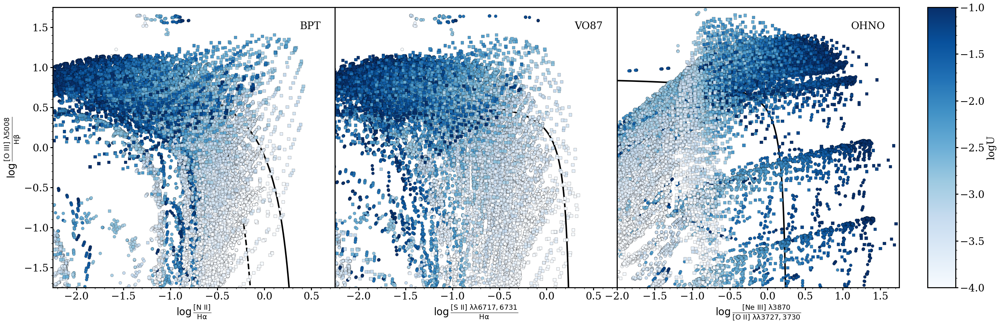

In [71]:
fig = plt.figure(figsize=(32,10))
gs = GridSpec(nrows=10, ncols=32)
gs.update(wspace=0.0, hspace=0.0)

ax = fig.add_subplot(gs[0:10, 0:10])
colorbar_data = ax.scatter(np.log10(linesdf['N_2_6583.45A']/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['logU'], ec='k', linewidths=0.2, cmap='Blues', vmin=-4, vmax=-1)
colorbar_data = ax.scatter(np.log10(AGN_solar['N_2_6583.45A']/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['logU'], ec='k', linewidths=0.2, cmap='Blues', vmin=-4, vmax=-1, marker='s')
plot_bpt_kewley_2001(ax)
plot_bpt_kauffmann_2003(ax)
ax.set_xlim(-2.25, 0.75)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 10:20])
ax.scatter(np.log10((linesdf['S_2_6716.44A']+linesdf['S_2_6730.82A'])/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['logU'], ec='k', linewidths=0.2, cmap='Blues', vmin=-4, vmax=-1)
ax.scatter(np.log10((AGN_solar['S_2_6716.44A']+AGN_solar['S_2_6730.82A'])/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['logU'], ec='k', linewidths=0.2, cmap='Blues', vmin=-4, vmax=-1, marker='s')
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2.25, 0.75)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 20:30])
ax.scatter(np.log10(linesdf['Ne_3_3868.76A']/(linesdf['O_2_3726.03A']+linesdf['O_2_3728.81A'])), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['logU'], ec='k', linewidths=0.2, cmap='Blues', vmin=-4, vmax=-1)
ax.scatter(np.log10(AGN_solar['Ne_3_3868.76A']/(AGN_solar['O_2_3726.03A']+AGN_solar['O_2_3728.81A'])), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['logU'], ec='k', linewidths=0.2, cmap='Blues', vmin=-4, vmax=-1, marker='s')
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 1.5)
ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 31:32])
fig.colorbar(colorbar_data, ax, use_gridspec=True, label = 'logU')

plt.show()

/opt/miniconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


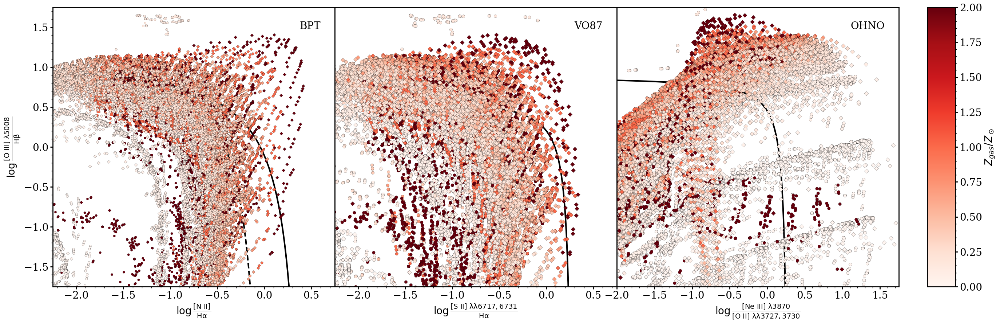

In [69]:
fig = plt.figure(figsize=(32,10))
gs = GridSpec(nrows=10, ncols=32)
gs.update(wspace=0.0, hspace=0.0)

ax = fig.add_subplot(gs[0:10, 0:10])
colorbar_data = ax.scatter(np.log10(linesdf['N_2_6583.45A']/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['zgas'], ec='k', linewidths=0.2, cmap='Reds', vmin=0, vmax=2, s=20)
colorbar_data = ax.scatter(np.log10(AGN_solar['N_2_6583.45A']/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['zgas'], ec='k', linewidths=0.2, cmap='Reds', vmin=0, vmax=2, marker='D', s=20)
plot_bpt_kewley_2001(ax)
plot_bpt_kauffmann_2003(ax)
ax.set_xlim(-2.25, 0.75)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 10:20])
ax.scatter(np.log10((linesdf['S_2_6716.44A']+linesdf['S_2_6730.82A'])/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['zgas'], ec='k', linewidths=0.2, cmap='Reds', vmin=0, vmax=2)
ax.scatter(np.log10((AGN_solar['S_2_6716.44A']+AGN_solar['S_2_6730.82A'])/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['zgas'], ec='k', linewidths=0.2, cmap='Reds', vmin=0, vmax=2, marker='D')
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2.25, 0.75)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 20:30])
ax.scatter(np.log10(linesdf['Ne_3_3868.76A']/(linesdf['O_2_3726.03A']+linesdf['O_2_3728.81A'])), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['zgas'], ec='k', linewidths=0.2, cmap='Reds', vmin=0, vmax=2)
ax.scatter(np.log10(AGN_solar['Ne_3_3868.76A']/(AGN_solar['O_2_3726.03A']+AGN_solar['O_2_3728.81A'])), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['zgas'], ec='k', linewidths=0.2, cmap='Reds', vmin=0, vmax=2, marker='D')
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 1.5)
ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 31:32])
fig.colorbar(colorbar_data, ax, use_gridspec=True, label = '$Z_{gas}/Z_\odot$')

plt.show()

/opt/miniconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


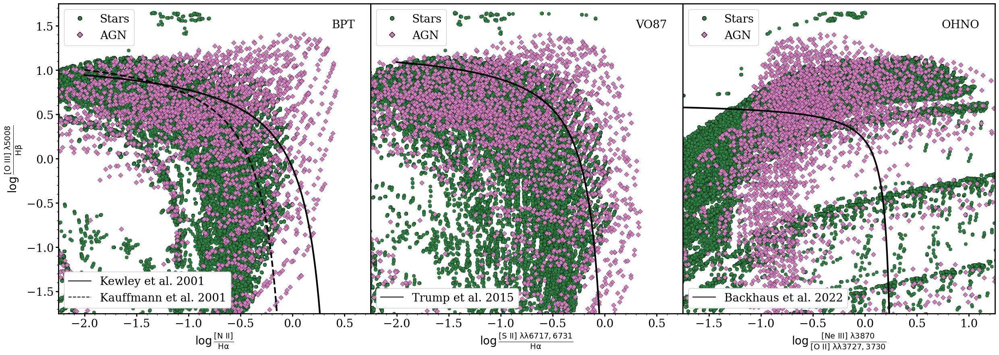

In [124]:
fig = plt.figure(figsize=(32,10))
gs = GridSpec(nrows=10, ncols=32)
gs.update(wspace=0.0, hspace=0.0)

ax = fig.add_subplot(gs[0:10, 0:10])
ax.scatter(np.log10(linesdf['N_2_6583.45A']/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=COLOR_STARS, ec='k', linewidths=0.3, alpha=1.0,  zorder=-9)
ax.scatter(np.log10(AGN_solar['N_2_6583.45A']/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=COLOR_AGN, ec='k', linewidths=0.3, marker='D', alpha=1.0,  zorder=-9)
plot_bpt_kewley_2001(ax, label=True)
plot_bpt_kauffmann_2003(ax, label=True)
ax.set_xlim(-2.25, 0.75)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')
legend_elements_points = [Line2D([0], [0], marker='o', color='none', label='Stars', markerfacecolor=COLOR_STARS, markeredgecolor='black', markersize=np.sqrt(50)),
                    Line2D([0], [0], marker='D', color='none', label='AGN', markerfacecolor=COLOR_AGN, markeredgecolor='black', markersize=np.sqrt(50)),
                    ]      
legend_elements_lines = [Line2D([0], [0], color='k', label='Kewley et al. 2001'),
                         Line2D([0], [0], color='k', linestyle='--', label='Kauffmann et al. 2001')
                    ]       
    
ax.add_artist(ax.legend(handles=legend_elements_points, loc='upper left', framealpha=0.95))
ax.add_artist(ax.legend(handles=legend_elements_lines, loc='lower left', framealpha=0.95))

ax = fig.add_subplot(gs[0:10, 10:20])
ax.scatter(np.log10((linesdf['S_2_6716.44A']+linesdf['S_2_6730.82A'])/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=COLOR_STARS, ec='k', linewidths=0.3, alpha=1.0, label='Stars', zorder=-9)
ax.scatter(np.log10((AGN_solar['S_2_6716.44A']+AGN_solar['S_2_6730.82A'])/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=COLOR_AGN, ec='k', linewidths=0.3, marker='D', alpha=1.0, label='AGN', zorder=-9)
plot_vo87_trump_2015(ax)
ax.set_xlim(-2.25, 0.75)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')
legend_elements_points = [Line2D([0], [0], marker='o', color='none', label='Stars', markerfacecolor=COLOR_STARS, markeredgecolor='black', markersize=np.sqrt(50)),
                    Line2D([0], [0], marker='D', color='none', label='AGN', markerfacecolor=COLOR_AGN, markeredgecolor='black', markersize=np.sqrt(50)),
                    ]      
legend_elements_lines = [Line2D([0], [0], color='k', label='Trump et al. 2015')
                    ]       
    
ax.add_artist(ax.legend(handles=legend_elements_points, loc='upper left', framealpha=0.95))
ax.add_artist(ax.legend(handles=legend_elements_lines, loc='lower left', framealpha=0.95))

ax = fig.add_subplot(gs[0:10, 20:30])
ax.scatter(np.log10(linesdf['Ne_3_3868.76A']/(linesdf['O_2_3726.03A']+linesdf['O_2_3728.81A'])), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=COLOR_STARS, ec='k', linewidths=0.3, alpha=1.0, label='Stars', zorder=-9)
ax.scatter(np.log10(AGN_solar['Ne_3_3868.76A']/(AGN_solar['O_2_3726.03A']+AGN_solar['O_2_3728.81A'])), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=COLOR_AGN, ec='k', linewidths=0.3, marker='D', alpha=1.0, label='AGN', zorder=-9)
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-1.75, 1.25)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

legend_elements_points = [Line2D([0], [0], marker='o', color='none', label='Stars', markerfacecolor=COLOR_STARS, markeredgecolor='black', markersize=np.sqrt(50)),
                    Line2D([0], [0], marker='D', color='none', label='AGN', markerfacecolor=COLOR_AGN, markeredgecolor='black', markersize=np.sqrt(50)),
                    ]      
legend_elements_lines = [Line2D([0], [0], color='k', label='Backhaus et al. 2022')
                    ]       
    
ax.add_artist(ax.legend(handles=legend_elements_points, loc='upper left', framealpha=0.95))
ax.add_artist(ax.legend(handles=legend_elements_lines, loc='lower left', framealpha=0.95))

plt.show()

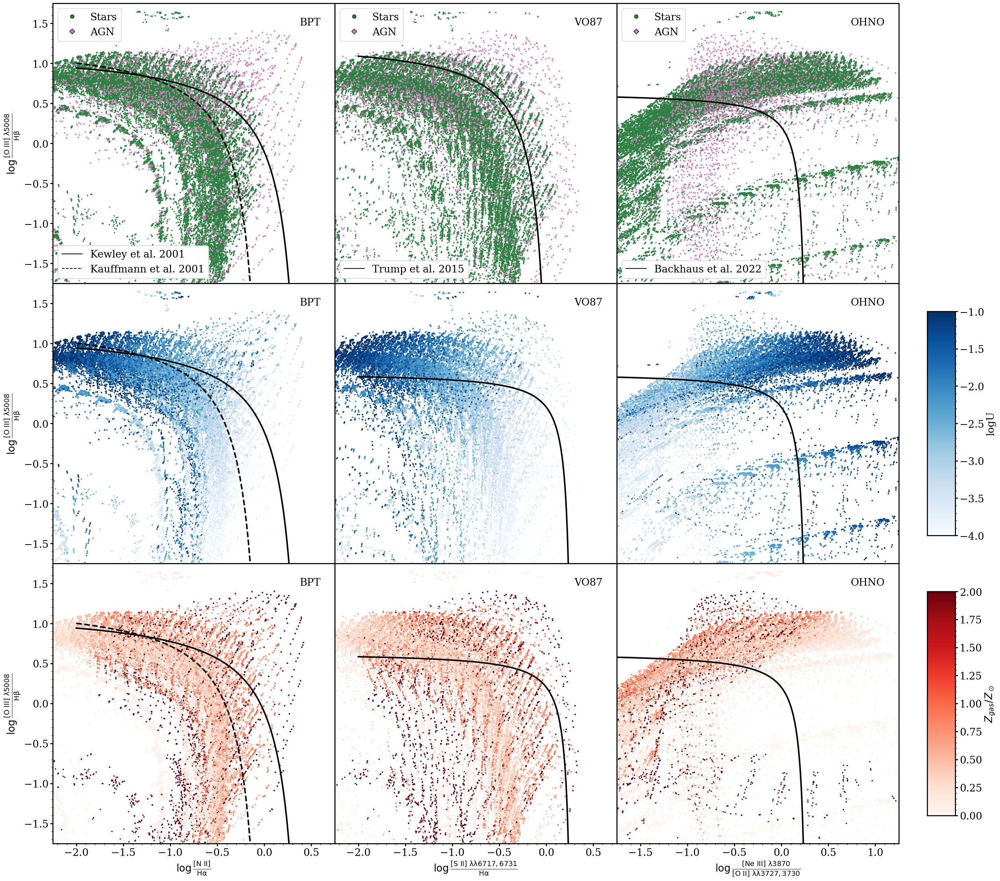

In [146]:
fig = plt.figure(figsize=(32,30))
gs = GridSpec(nrows=30, ncols=32)
gs.update(wspace=0.0, hspace=0.0)

ax = fig.add_subplot(gs[0:10, 0:10])
ax.scatter(np.log10(linesdf['N_2_6583.45A']/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=COLOR_STARS, alpha=1.0,  zorder=-9,s=3)
ax.scatter(np.log10(AGN_solar['N_2_6583.45A']/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=COLOR_AGN, marker='D', alpha=1.0,  zorder=-9,s=3)
plot_bpt_kewley_2001(ax, label=True)
plot_bpt_kauffmann_2003(ax, label=True)
ax.set_xlim(-2.25, 0.75)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')
legend_elements_points = [Line2D([0], [0], marker='o', color='none', label='Stars', markerfacecolor=COLOR_STARS, markeredgecolor='black', markersize=np.sqrt(50)),
                    Line2D([0], [0], marker='D', color='none', label='AGN', markerfacecolor=COLOR_AGN, markeredgecolor='black', markersize=np.sqrt(50)),
                    ]      
legend_elements_lines = [Line2D([0], [0], color='k', label='Kewley et al. 2001'),
                         Line2D([0], [0], color='k', linestyle='--', label='Kauffmann et al. 2001')
                    ]       
    
ax.add_artist(ax.legend(handles=legend_elements_points, loc='upper left', framealpha=0.95))
ax.add_artist(ax.legend(handles=legend_elements_lines, loc='lower left', framealpha=0.95))

ax = fig.add_subplot(gs[0:10, 10:20])
ax.scatter(np.log10((linesdf['S_2_6716.44A']+linesdf['S_2_6730.82A'])/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=COLOR_STARS, alpha=1.0, label='Stars', zorder=-9,s=3)
ax.scatter(np.log10((AGN_solar['S_2_6716.44A']+AGN_solar['S_2_6730.82A'])/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=COLOR_AGN, marker='D', alpha=1.0, label='AGN', zorder=-9,s=3)
plot_vo87_trump_2015(ax)
ax.set_xlim(-2.25, 0.75)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')
legend_elements_points = [Line2D([0], [0], marker='o', color='none', label='Stars', markerfacecolor=COLOR_STARS, markeredgecolor='black', markersize=np.sqrt(50)),
                    Line2D([0], [0], marker='D', color='none', label='AGN', markerfacecolor=COLOR_AGN, markeredgecolor='black', markersize=np.sqrt(50)),
                    ]      
legend_elements_lines = [Line2D([0], [0], color='k', label='Trump et al. 2015')
                    ]       
    
ax.add_artist(ax.legend(handles=legend_elements_points, loc='upper left', framealpha=0.95))
ax.add_artist(ax.legend(handles=legend_elements_lines, loc='lower left', framealpha=0.95))

ax = fig.add_subplot(gs[0:10, 20:30])
ax.scatter(np.log10(linesdf['Ne_3_3868.76A']/(linesdf['O_2_3726.03A']+linesdf['O_2_3728.81A'])), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=COLOR_STARS, alpha=1.0, label='Stars', zorder=-9,s=3)
ax.scatter(np.log10(AGN_solar['Ne_3_3868.76A']/(AGN_solar['O_2_3726.03A']+AGN_solar['O_2_3728.81A'])), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=COLOR_AGN, marker='D', alpha=1.0, label='AGN', zorder=-9,s=3)
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-1.75, 1.25)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

legend_elements_points = [Line2D([0], [0], marker='o', color='none', label='Stars', markerfacecolor=COLOR_STARS, markeredgecolor='black', markersize=np.sqrt(50)),
                    Line2D([0], [0], marker='D', color='none', label='AGN', markerfacecolor=COLOR_AGN, markeredgecolor='black', markersize=np.sqrt(50)),
                    ]      
legend_elements_lines = [Line2D([0], [0], color='k', label='Backhaus et al. 2022')
                    ]       
    
ax.add_artist(ax.legend(handles=legend_elements_points, loc='upper left', framealpha=0.95))
ax.add_artist(ax.legend(handles=legend_elements_lines, loc='lower left', framealpha=0.95))

#log U row
ax = fig.add_subplot(gs[10:20, 0:10])
colorbar_data = ax.scatter(np.log10(linesdf['N_2_6583.45A']/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['logU'], cmap='Blues', vmin=-4, vmax=-1, zorder=-9,s=3)
colorbar_data = ax.scatter(np.log10(AGN_solar['N_2_6583.45A']/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['logU'], cmap='Blues', vmin=-4, vmax=-1, marker='D', zorder=-9,s=3)
plot_bpt_kewley_2001(ax)
plot_bpt_kauffmann_2003(ax)
ax.set_xlim(-2.25, 0.75)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[10:20, 10:20])
ax.scatter(np.log10((linesdf['S_2_6716.44A']+linesdf['S_2_6730.82A'])/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['logU'], cmap='Blues', vmin=-4, vmax=-1, zorder=-9,s=3)
ax.scatter(np.log10((AGN_solar['S_2_6716.44A']+AGN_solar['S_2_6730.82A'])/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['logU'], cmap='Blues', vmin=-4, vmax=-1, marker='D', zorder=-9,s=3)
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2.25, 0.75)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[10:20, 20:30])
ax.scatter(np.log10(linesdf['Ne_3_3868.76A']/(linesdf['O_2_3726.03A']+linesdf['O_2_3728.81A'])), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['logU'], cmap='Blues', vmin=-4, vmax=-1, zorder=-9,s=3)
ax.scatter(np.log10(AGN_solar['Ne_3_3868.76A']/(AGN_solar['O_2_3726.03A']+AGN_solar['O_2_3728.81A'])), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['logU'], cmap='Blues', vmin=-4, vmax=-1, marker='D', zorder=-9,s=3)
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-1.75, 1.25)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[11:19, 31:32])
fig.colorbar(colorbar_data, ax, use_gridspec=True, label = 'logU')


# Metallicity row
ax = fig.add_subplot(gs[20:30, 0:10])
colorbar_data = ax.scatter(np.log10(linesdf['N_2_6583.45A']/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['zgas'], cmap='Reds', vmin=0, vmax=2, zorder=-9,s=3)
colorbar_data = ax.scatter(np.log10(AGN_solar['N_2_6583.45A']/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['zgas'], cmap='Reds', vmin=0, vmax=2, marker='D', zorder=-9,s=3)
plot_bpt_kewley_2001(ax)
plot_bpt_kauffmann_2003(ax)
ax.set_xlim(-2.25, 0.75)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[20:30, 10:20])
ax.scatter(np.log10((linesdf['S_2_6716.44A']+linesdf['S_2_6730.82A'])/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['zgas'], cmap='Reds', vmin=0, vmax=2, zorder=-9,s=3)
ax.scatter(np.log10((AGN_solar['S_2_6716.44A']+AGN_solar['S_2_6730.82A'])/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['zgas'], cmap='Reds', vmin=0, vmax=2, marker='D', zorder=-9,s=3)
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2.25, 0.75)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[20:30, 20:30])
ax.scatter(np.log10(linesdf['Ne_3_3868.76A']/(linesdf['O_2_3726.03A']+linesdf['O_2_3728.81A'])), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['zgas'], cmap='Reds', vmin=0, vmax=2, zorder=-9,s=3)
ax.scatter(np.log10(AGN_solar['Ne_3_3868.76A']/(AGN_solar['O_2_3726.03A']+AGN_solar['O_2_3728.81A'])), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['zgas'], cmap='Reds', vmin=0, vmax=2, marker='D', zorder=-9,s=3)
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-1.75, 1.25)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[21:29, 31:32])
fig.colorbar(colorbar_data, ax, use_gridspec=True, label = '$Z_{gas}/Z_\odot$')

plt.savefig('diagnostics_grid.png', bbox_inches='tight')
plt.show()

/opt/miniconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


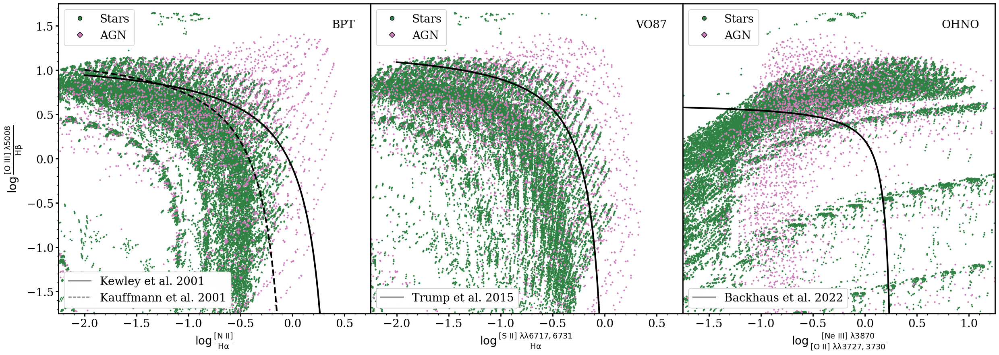

In [8]:
linesdf = pd.read_csv('BPASS_all_solar_models.csv')
AGN_solar = pd.read_csv('AGN_solar.csv')

fig = plt.figure(figsize=(32,30))
gs = GridSpec(nrows=30, ncols=32)
gs.update(wspace=0.0, hspace=0.0)

ax = fig.add_subplot(gs[0:10, 0:10])
ax.scatter(np.log10(linesdf['N_2_6583.45A']/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=COLOR_STARS, alpha=1.0,  zorder=-9,s=3)
ax.scatter(np.log10(AGN_solar['N_2_6583.45A']/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=COLOR_AGN, marker='D', alpha=1.0,  zorder=-9,s=3)
plot_bpt_kewley_2001(ax, label=True)
plot_bpt_kauffmann_2003(ax, label=True)
ax.set_xlim(-2.25, 0.75)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')
legend_elements_points = [Line2D([0], [0], marker='o', color='none', label='Stars', markerfacecolor=COLOR_STARS, markeredgecolor='black', markersize=np.sqrt(50)),
                    Line2D([0], [0], marker='D', color='none', label='AGN', markerfacecolor=COLOR_AGN, markeredgecolor='black', markersize=np.sqrt(50)),
                    ]      
legend_elements_lines = [Line2D([0], [0], color='k', label='Kewley et al. 2001'),
                         Line2D([0], [0], color='k', linestyle='--', label='Kauffmann et al. 2001')
                    ]       
    
ax.add_artist(ax.legend(handles=legend_elements_points, loc='upper left', framealpha=0.95))
ax.add_artist(ax.legend(handles=legend_elements_lines, loc='lower left', framealpha=0.95))

ax = fig.add_subplot(gs[0:10, 10:20])
ax.scatter(np.log10((linesdf['S_2_6716.44A']+linesdf['S_2_6730.82A'])/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=COLOR_STARS, alpha=1.0, label='Stars', zorder=-9,s=3)
ax.scatter(np.log10((AGN_solar['S_2_6716.44A']+AGN_solar['S_2_6730.82A'])/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=COLOR_AGN, marker='D', alpha=1.0, label='AGN', zorder=-9,s=3)
plot_vo87_trump_2015(ax)
ax.set_xlim(-2.25, 0.75)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')
legend_elements_points = [Line2D([0], [0], marker='o', color='none', label='Stars', markerfacecolor=COLOR_STARS, markeredgecolor='black', markersize=np.sqrt(50)),
                    Line2D([0], [0], marker='D', color='none', label='AGN', markerfacecolor=COLOR_AGN, markeredgecolor='black', markersize=np.sqrt(50)),
                    ]      
legend_elements_lines = [Line2D([0], [0], color='k', label='Trump et al. 2015')
                    ]       
    
ax.add_artist(ax.legend(handles=legend_elements_points, loc='upper left', framealpha=0.95))
ax.add_artist(ax.legend(handles=legend_elements_lines, loc='lower left', framealpha=0.95))

ax = fig.add_subplot(gs[0:10, 20:30])
ax.scatter(np.log10(linesdf['Ne_3_3868.76A']/(linesdf['O_2_3726.03A']+linesdf['O_2_3728.81A'])), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=COLOR_STARS, alpha=1.0, label='Stars', zorder=-9,s=3)
ax.scatter(np.log10(AGN_solar['Ne_3_3868.76A']/(AGN_solar['O_2_3726.03A']+AGN_solar['O_2_3728.81A'])), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=COLOR_AGN, marker='D', alpha=1.0, label='AGN', zorder=-9,s=3)
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-1.75, 1.25)
ax.set_ylim(-1.75, 1.75)
ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

legend_elements_points = [Line2D([0], [0], marker='o', color='none', label='Stars', markerfacecolor=COLOR_STARS, markeredgecolor='black', markersize=np.sqrt(50)),
                    Line2D([0], [0], marker='D', color='none', label='AGN', markerfacecolor=COLOR_AGN, markeredgecolor='black', markersize=np.sqrt(50)),
                    ]      
legend_elements_lines = [Line2D([0], [0], color='k', label='Backhaus et al. 2022')
                    ]       
    
ax.add_artist(ax.legend(handles=legend_elements_points, loc='upper left', framealpha=0.95))
ax.add_artist(ax.legend(handles=legend_elements_lines, loc='lower left', framealpha=0.95))

# #log U row
# ax = fig.add_subplot(gs[10:20, 0:10])
# colorbar_data = ax.scatter(np.log10(linesdf['N_2_6583.45A']/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
#            c=linesdf['logU'], cmap='Blues', vmin=-4, vmax=-1, zorder=-9,s=3)
# colorbar_data = ax.scatter(np.log10(AGN_solar['N_2_6583.45A']/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
#            c=AGN_solar['logU'], cmap='Blues', vmin=-4, vmax=-1, marker='D', zorder=-9,s=3)
# plot_bpt_kewley_2001(ax)
# plot_bpt_kauffmann_2003(ax)
# ax.set_xlim(-2.25, 0.75)
# ax.set_ylim(-1.75, 1.75)
# ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
# ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
# ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

# ax = fig.add_subplot(gs[10:20, 10:20])
# ax.scatter(np.log10((linesdf['S_2_6716.44A']+linesdf['S_2_6730.82A'])/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
#            c=linesdf['logU'], cmap='Blues', vmin=-4, vmax=-1, zorder=-9,s=3)
# ax.scatter(np.log10((AGN_solar['S_2_6716.44A']+AGN_solar['S_2_6730.82A'])/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
#            c=AGN_solar['logU'], cmap='Blues', vmin=-4, vmax=-1, marker='D', zorder=-9,s=3)
# plot_ohno_backhaus_2022(ax)
# ax.set_xlim(-2.25, 0.75)
# ax.set_ylim(-1.75, 1.75)
# ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
# ax.tick_params(left=False, labelleft=False, which='both')
# ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

# ax = fig.add_subplot(gs[10:20, 20:30])
# ax.scatter(np.log10(linesdf['Ne_3_3868.76A']/(linesdf['O_2_3726.03A']+linesdf['O_2_3728.81A'])), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
#            c=linesdf['logU'], cmap='Blues', vmin=-4, vmax=-1, zorder=-9,s=3)
# ax.scatter(np.log10(AGN_solar['Ne_3_3868.76A']/(AGN_solar['O_2_3726.03A']+AGN_solar['O_2_3728.81A'])), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
#            c=AGN_solar['logU'], cmap='Blues', vmin=-4, vmax=-1, marker='D', zorder=-9,s=3)
# plot_ohno_backhaus_2022(ax)
# ax.set_xlim(-1.75, 1.25)
# ax.set_ylim(-1.75, 1.75)
# ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
# ax.tick_params(left=False, labelleft=False, which='both')
# ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

# ax = fig.add_subplot(gs[11:19, 31:32])
# fig.colorbar(colorbar_data, ax, use_gridspec=True, label = 'logU')


# # Metallicity row
# ax = fig.add_subplot(gs[20:30, 0:10])
# colorbar_data = ax.scatter(np.log10(linesdf['N_2_6583.45A']/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
#            c=linesdf['zgas'], cmap='Reds', vmin=0, vmax=2, zorder=-9,s=3)
# colorbar_data = ax.scatter(np.log10(AGN_solar['N_2_6583.45A']/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
#            c=AGN_solar['zgas'], cmap='Reds', vmin=0, vmax=2, marker='D', zorder=-9,s=3)
# plot_bpt_kewley_2001(ax)
# plot_bpt_kauffmann_2003(ax)
# ax.set_xlim(-2.25, 0.75)
# ax.set_ylim(-1.75, 1.75)
# ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
# ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
# ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

# ax = fig.add_subplot(gs[20:30, 10:20])
# ax.scatter(np.log10((linesdf['S_2_6716.44A']+linesdf['S_2_6730.82A'])/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
#            c=linesdf['zgas'], cmap='Reds', vmin=0, vmax=2, zorder=-9,s=3)
# ax.scatter(np.log10((AGN_solar['S_2_6716.44A']+AGN_solar['S_2_6730.82A'])/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
#            c=AGN_solar['zgas'], cmap='Reds', vmin=0, vmax=2, marker='D', zorder=-9,s=3)
# plot_ohno_backhaus_2022(ax)
# ax.set_xlim(-2.25, 0.75)
# ax.set_ylim(-1.75, 1.75)
# ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
# ax.tick_params(left=False, labelleft=False, which='both')
# ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

# ax = fig.add_subplot(gs[20:30, 20:30])
# ax.scatter(np.log10(linesdf['Ne_3_3868.76A']/(linesdf['O_2_3726.03A']+linesdf['O_2_3728.81A'])), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
#            c=linesdf['zgas'], cmap='Reds', vmin=0, vmax=2, zorder=-9,s=3)
# ax.scatter(np.log10(AGN_solar['Ne_3_3868.76A']/(AGN_solar['O_2_3726.03A']+AGN_solar['O_2_3728.81A'])), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
#            c=AGN_solar['zgas'], cmap='Reds', vmin=0, vmax=2, marker='D', zorder=-9,s=3)
# plot_ohno_backhaus_2022(ax)
# ax.set_xlim(-1.75, 1.25)
# ax.set_ylim(-1.75, 1.75)
# ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
# ax.tick_params(left=False, labelleft=False, which='both')
# ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

# ax = fig.add_subplot(gs[21:29, 31:32])
# fig.colorbar(colorbar_data, ax, use_gridspec=True, label = '$Z_{gas}/Z_\odot$')

plt.savefig('diagnostics_model_threepanel.png', bbox_inches='tight')
plt.show()

/opt/miniconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


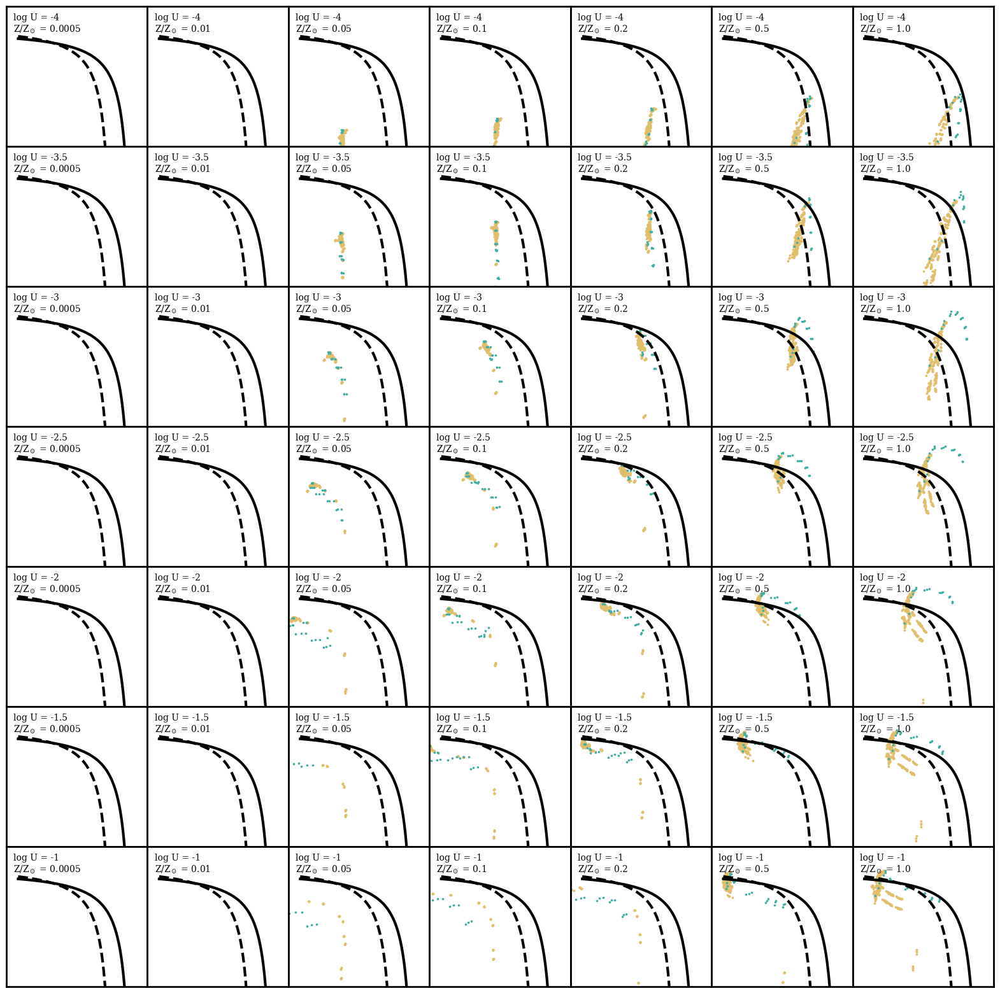

In [61]:
linesdf = pd.read_csv('BPASS_all_solar_models.csv')
AGN_solar = pd.read_csv('AGN_solar.csv')

fig = plt.figure(figsize=(20,20))
gs = GridSpec(nrows=7, ncols=7)
gs.update(wspace=0.0, hspace=0.0)

logU_grid = [-4, -3.5, -3, -2.5, -2, -1.5, -1]
Z_grid = [0.0005, 0.01, 0.05, 0.1, 0.2, 0.5, 1.0]

for i, logU in enumerate(logU_grid):
    for j, Z in enumerate(Z_grid):

        subdf_bpass = linesdf[(linesdf.logU == logU)&(linesdf.zgas == Z)]
        subdf_agn = AGN_solar[(AGN_solar.logU == logU)&(AGN_solar.zgas == Z)]

        ax = fig.add_subplot(gs[i:i+1, j:j+1])
        ax.scatter(np.log10(subdf_bpass['N_2_6583.45A']/subdf_bpass['H_1_6562.81A']), np.log10(subdf_bpass['O_3_5006.84A']/subdf_bpass['H_1_4861.33A']), 
                c=COLOR_STARS, alpha=1.0,  zorder=-9,s=3)
        ax.scatter(np.log10(subdf_agn['N_2_6583.45A']/subdf_agn['H_1_6562.81A']), np.log10(subdf_agn['O_3_5006.84A']/subdf_agn['H_1_4861.33A']), 
                c=COLOR_AGN, marker='x', alpha=1.0,  zorder=-9,s=3)
        plot_bpt_kewley_2001(ax, label=True)
        plot_bpt_kauffmann_2003(ax, label=True)
        ax.set_xlim(-2.25, 0.75)
        ax.set_ylim(-1.75, 1.75)
        ax.tick_params(bottom=False, labelbottom=False, left=False, labelleft=False, which='both')
        ax.annotate(f'log U = {logU}\nZ/Z$_\odot$ = {Z}', (0.05, 0.95), xycoords='axes fraction', ha='left', va='top', fontsize=10)
        # ax.annotate(f'Z/Z$_\odot$ = {Z}', (0.1, 0.9), xycoords='axes fraction')


# plt.xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
# plt.ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')

plt.savefig('bpt_grid.pdf', bbox_inches='tight')
plt.show()

In [4]:
logU_grid = [-4, -3, -2, -1]

for i, j in enumerate(logU_grid[0:3]):
    print(i,j)

0 -4
1 -3
2 -2


In [11]:
np.sort(linesdf.zgas.unique())

array([5.0e-04, 5.0e-03, 5.0e-02, 1.0e-01, 1.5e-01, 2.0e-01, 2.5e-01,
       3.0e-01, 4.0e-01, 5.0e-01, 7.0e-01, 1.0e+00, 2.0e+00])

/opt/miniconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


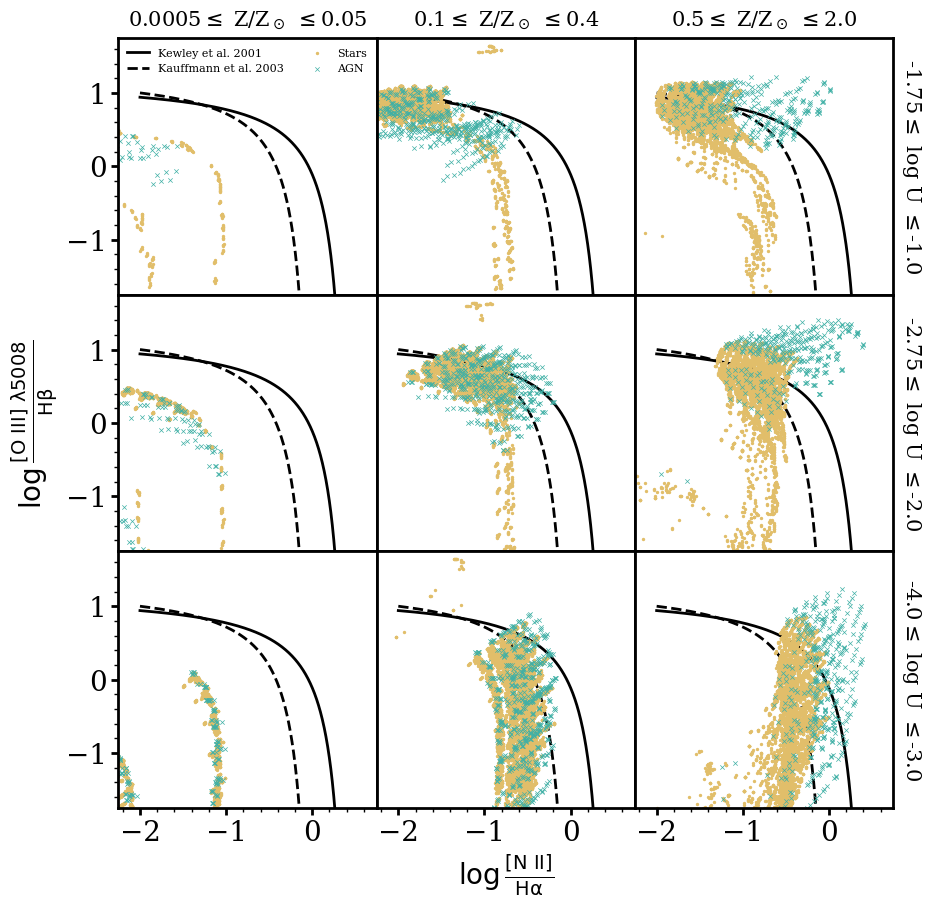

In [ ]:
linesdf = pd.read_csv('BPASS_all_solar_models.csv')
AGN_solar = pd.read_csv('AGN_solar.csv')

fig = plt.figure(figsize=(10,10))
gs = GridSpec(nrows=3, ncols=3)
gs.update(wspace=0.0, hspace=0.0)

logU_grid = [[-1.75, -1.5, -1.25, -1.0],
             [-2.75, -2.5, -2.25, -2.0], 
             [-4.0, -3.75, -3.5, -3.25, -3.0]
             ]
Z_grid = [[5.0e-04, 5.0e-03, 5.0e-02], 
          [1.0e-01, 1.5e-01, 2.0e-01, 2.5e-01, 3.0e-01, 4.0e-01], 
          [5.0e-01, 7.0e-01, 1.0e+00, 2.0e+00]]

for i, logU in enumerate(logU_grid):
    for j, Z in enumerate(Z_grid):

        subdf_bpass = linesdf[(linesdf.logU >= logU_grid[i][0])&((linesdf.logU <= logU_grid[i][-1]))&(linesdf.zgas >= Z_grid[j][0])&(linesdf.zgas <= Z_grid[j][-1])]
        subdf_agn = AGN_solar[(AGN_solar.logU >= logU_grid[i][0])&((AGN_solar.logU <= logU_grid[i][-1]))&(AGN_solar.zgas >= Z_grid[j][0])&(AGN_solar.zgas <= Z_grid[j][-1])]

        ax = fig.add_subplot(gs[i:i+1, j:j+1])
        plot_bpt_kewley_2001(ax, label=True, lw=2)
        plot_bpt_kauffmann_2003(ax, label=True, lw=2)
        ax.scatter(np.log10(subdf_bpass['N_2_6583.45A']/subdf_bpass['H_1_6562.81A']), np.log10(subdf_bpass['O_3_5006.84A']/subdf_bpass['H_1_4861.33A']), 
                c=COLOR_STARS, alpha=1.0,  zorder=-9, s=2, label='Stars', rasterized=True)
        ax.scatter(np.log10(subdf_agn['N_2_6583.45A']/subdf_agn['H_1_6562.81A']), np.log10(subdf_agn['O_3_5006.84A']/subdf_agn['H_1_4861.33A']), 
                c=COLOR_AGN, marker='x', lw=0.5, alpha=1.0,  zorder=-9, s=10, label='AGN', rasterized=True)
        ax.set_xlim(-2.25, 0.75)
        ax.set_ylim(-1.75, 1.75)
        if i==0 and j==0:
            ax.legend(frameon=False, fontsize=8, ncols=2)
        if i==2 and j==1:
            ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
        if i==1 and j==0:
            ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
        if j!=0:
            ax.tick_params(left=False,labelleft=False, which='both')
        if i == 0:
            ax.annotate(f'{Z_grid[j][0]}$\leq$ Z/Z$_\odot$ $\leq${Z_grid[j][-1]}', (0.5, 1.025), xycoords='axes fraction', ha='center', va='bottom', fontsize=15)
        if j == 2:
            ax.annotate(f'{logU_grid[i][0]}$\leq$ log U $\leq${logU_grid[i][-1]}', (1.025, 0.5), xycoords='axes fraction', ha='left', va='center', fontsize=15, rotation=270)

plt.savefig('bpt_grid.pdf', bbox_inches='tight')
plt.show()

/opt/miniconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


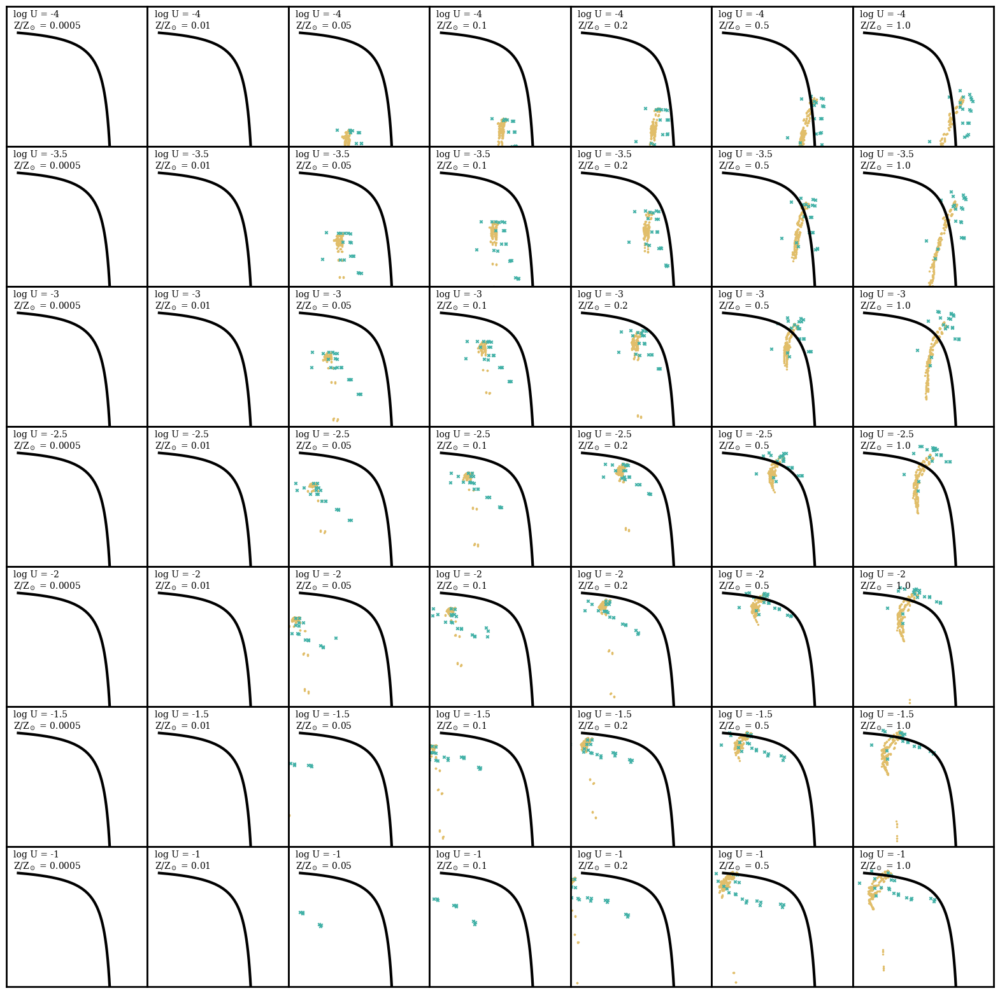

In [60]:
linesdf = pd.read_csv('BPASS_all_solar_models.csv')
AGN_solar = pd.read_csv('AGN_solar.csv')

fig = plt.figure(figsize=(20,20))
gs = GridSpec(nrows=7, ncols=7)
gs.update(wspace=0.0, hspace=0.0)

logU_grid = [-4, -3.5, -3, -2.5, -2, -1.5, -1]
Z_grid = [0.0005, 0.01, 0.05, 0.1, 0.2, 0.5, 1.0]

for i, logU in enumerate(logU_grid):
    for j, Z in enumerate(Z_grid):

        subdf_bpass = linesdf[(linesdf.logU == logU)&(linesdf.zgas == Z)]
        subdf_agn = AGN_solar[(AGN_solar.logU == logU)&(AGN_solar.zgas == Z)]

        ax = fig.add_subplot(gs[i:i+1, j:j+1])
        ax.scatter(np.log10((subdf_bpass['S_2_6716.44A']+subdf_bpass['S_2_6730.82A'])/subdf_bpass['H_1_6562.81A']), np.log10(subdf_bpass['O_3_5006.84A']/subdf_bpass['H_1_4861.33A']), 
           c=COLOR_STARS, alpha=1.0, label='Stars', zorder=-9, s=2)
        ax.scatter(np.log10((subdf_agn['S_2_6716.44A']+subdf_agn['S_2_6730.82A'])/subdf_agn['H_1_6562.81A']), np.log10(subdf_agn['O_3_5006.84A']/subdf_agn['H_1_4861.33A']), 
                c=COLOR_AGN, marker='x', alpha=1.0, label='AGN', zorder=-9, s=10)
        plot_vo87_trump_2015(ax)
        ax.set_xlim(-2.25, 0.75)
        ax.set_ylim(-1.75, 1.75)
        ax.tick_params(bottom=False, labelbottom=False, left=False, labelleft=False, which='both')
        ax.annotate(f'log U = {logU}\nZ/Z$_\odot$ = {Z}', (0.05, 0.975), xycoords='axes fraction', ha='left', va='top', fontsize=10)
        # ax.annotate(f'Z/Z$_\odot$ = {Z}', (0.1, 0.9), xycoords='axes fraction')


# plt.xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
# plt.ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')

plt.savefig('vo87_grid.pdf', bbox_inches='tight')
plt.show()

/opt/miniconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


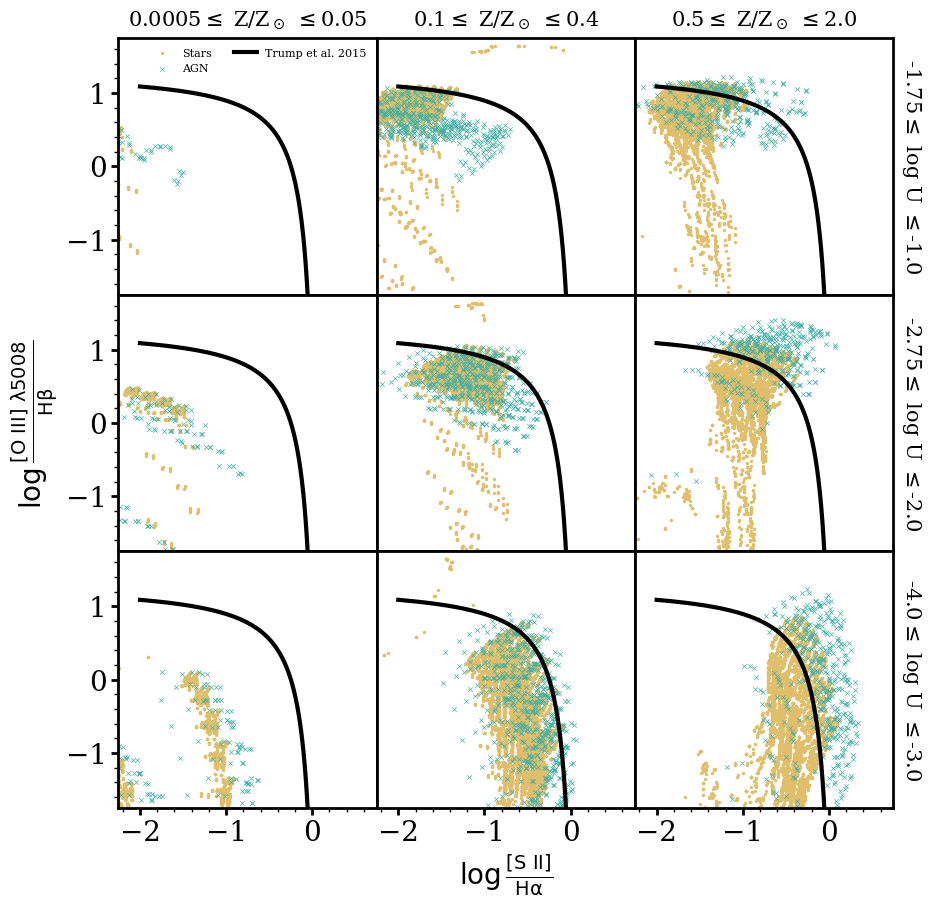

In [72]:
linesdf = pd.read_csv('BPASS_all_solar_models.csv')
AGN_solar = pd.read_csv('AGN_solar.csv')

fig = plt.figure(figsize=(10,10))
gs = GridSpec(nrows=3, ncols=3)
gs.update(wspace=0.0, hspace=0.0)

logU_grid = [[-1.75, -1.5, -1.25, -1.0],
             [-2.75, -2.5, -2.25, -2.0], 
             [-4.0, -3.75, -3.5, -3.25, -3.0]
             ]
Z_grid = [[5.0e-04, 5.0e-03, 5.0e-02], 
          [1.0e-01, 1.5e-01, 2.0e-01, 2.5e-01, 3.0e-01, 4.0e-01], 
          [5.0e-01, 7.0e-01, 1.0e+00, 2.0e+00]]

for i, logU in enumerate(logU_grid):
    for j, Z in enumerate(Z_grid):

        subdf_bpass = linesdf[(linesdf.logU >= logU_grid[i][0])&((linesdf.logU <= logU_grid[i][-1]))&(linesdf.zgas >= Z_grid[j][0])&(linesdf.zgas <= Z_grid[j][-1])]
        subdf_agn = AGN_solar[(AGN_solar.logU >= logU_grid[i][0])&((AGN_solar.logU <= logU_grid[i][-1]))&(AGN_solar.zgas >= Z_grid[j][0])&(AGN_solar.zgas <= Z_grid[j][-1])]

        ax = fig.add_subplot(gs[i:i+1, j:j+1])
        ax.scatter(np.log10((subdf_bpass['S_2_6716.44A']+subdf_bpass['S_2_6730.82A'])/subdf_bpass['H_1_6562.81A']), np.log10(subdf_bpass['O_3_5006.84A']/subdf_bpass['H_1_4861.33A']), 
           c=COLOR_STARS, alpha=1.0, label='Stars', zorder=-9, s=2, rasterized=True)
        ax.scatter(np.log10((subdf_agn['S_2_6716.44A']+subdf_agn['S_2_6730.82A'])/subdf_agn['H_1_6562.81A']), np.log10(subdf_agn['O_3_5006.84A']/subdf_agn['H_1_4861.33A']), 
                c=COLOR_AGN, marker='x', alpha=1.0, label='AGN', lw=0.5, zorder=-9, s=10, rasterized=True)
        plot_vo87_trump_2015(ax)
        ax.set_xlim(-2.25, 0.75)
        ax.set_ylim(-1.75, 1.75)
        if i==0 and j==0:
            ax.legend(frameon=False, fontsize=8, ncols=2)
        if i==2 and j==1:
            ax.set_xlabel(r'$\log\frac{\rm{[S~II]}}{\rm{H}\alpha}$')
        if i==1 and j==0:
            ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
        if j!=0:
            ax.tick_params(left=False,labelleft=False, which='both')
        if i == 0:
            ax.annotate(f'{Z_grid[j][0]}$\leq$ Z/Z$_\odot$ $\leq${Z_grid[j][-1]}', (0.5, 1.025), xycoords='axes fraction', ha='center', va='bottom', fontsize=15)
        if j == 2:
            ax.annotate(f'{logU_grid[i][0]}$\leq$ log U $\leq${logU_grid[i][-1]}', (1.025, 0.5), xycoords='axes fraction', ha='left', va='center', fontsize=15, rotation=270)

plt.savefig('vo87_grid.pdf', bbox_inches='tight')
plt.show()

In [26]:
subdf_bpass

,Unnamed: 0,N_4_765.147A,N_3_991.000A,C_3_977.020A,C_2_904.142A,C_2_1036.34A,C_2_1037.02A,S_4_1062.66A,H_1_1215.68A,N_5_1238.82A,...,O_3_1666.15A.1,O_5_1218.34A,si_3_1892.03A,BLND_2335.00A,logU,zgas,hden,zstar,age,sed
92,hden3/BPASSv2.2.1_imf170_300_burst_binary_mode...,0.017664,0.001401,0.162430,0.010532,0.016808,0.020130,0.007235,2.06890,0.000000,...,0.003221,0.000000e+00,0.012680,0.003831,-1.0,1.0,3,1.0,6.5,BPASSv2.2.1_imf170_300_burst_binary.ascii
111,hden3/BPASSv2.2.1_imf170_300_burst_binary_mode...,0.007597,0.026383,0.167130,0.005576,0.035043,0.043687,0.026853,2.35730,0.004143,...,0.033860,1.545100e-08,0.031892,0.011160,-1.0,1.0,3,1.0,7.0,BPASSv2.2.1_imf170_300_burst_binary.ascii
140,hden3/BPASSv2.2.1_imf170_300_burst_binary_mode...,0.008539,0.058986,0.011967,0.001883,0.001644,0.002138,0.002786,1.57310,0.008470,...,0.057388,3.147700e-03,0.034356,0.013674,-1.0,1.0,3,1.0,10.0,BPASSv2.2.1_imf170_300_burst_binary.ascii
550,hden3/BPASSv2.2.1_imf170_300_burst_binary_mode...,0.000808,0.008994,0.061961,0.006129,0.016380,0.019793,0.028913,1.77450,0.099273,...,0.010184,2.392900e-06,0.040807,0.005445,-1.0,1.0,3,1.0,8.0,BPASSv2.2.1_imf170_300_burst_binary.ascii
554,hden3/BPASSv2.2.1_imf170_300_burst_binary_mode...,0.009182,0.057423,0.016309,0.002129,0.002203,0.002857,0.003363,1.60600,0.010098,...,0.051817,2.117100e-03,0.033655,0.013293,-1.0,1.0,3,1.0,9.5,BPASSv2.2.1_imf170_300_burst_binary.ascii
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71635,hden2/BPASSv2.2.1_imf100_300_burst_binary_mode...,0.000901,0.000048,0.012853,0.001162,0.001285,0.001924,0.000421,0.21234,0.000000,...,0.000066,0.000000e+00,0.000598,0.000185,-1.0,1.0,2,1.0,6.4,BPASSv2.2.1_imf100_300_burst_binary.ascii
71709,hden2/BPASSv2.2.1_imf100_300_burst_binary_mode...,0.000515,0.003100,0.007467,0.000423,0.002817,0.004296,0.002460,0.19173,0.001656,...,0.003368,1.258300e-08,0.002884,0.001099,-1.0,1.0,2,1.0,7.1,BPASSv2.2.1_imf100_300_burst_binary.ascii
71817,hden2/BPASSv2.2.1_imf100_300_burst_binary_mode...,0.000816,0.001908,0.017981,0.000692,0.002271,0.003455,0.001208,0.22516,0.000010,...,0.001774,2.388900e-12,0.002232,0.000912,-1.0,1.0,2,1.0,6.9,BPASSv2.2.1_imf100_300_burst_binary.ascii
72260,hden2/BPASSv2.2.1_imf100_300_burst_binary_mode...,0.001160,0.000183,0.014647,0.000981,0.001251,0.001899,0.000525,0.20478,0.000000,...,0.000303,0.000000e+00,0.001033,0.000439,-1.0,1.0,2,1.0,6.6,BPASSv2.2.1_imf100_300_burst_binary.ascii


/opt/miniconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


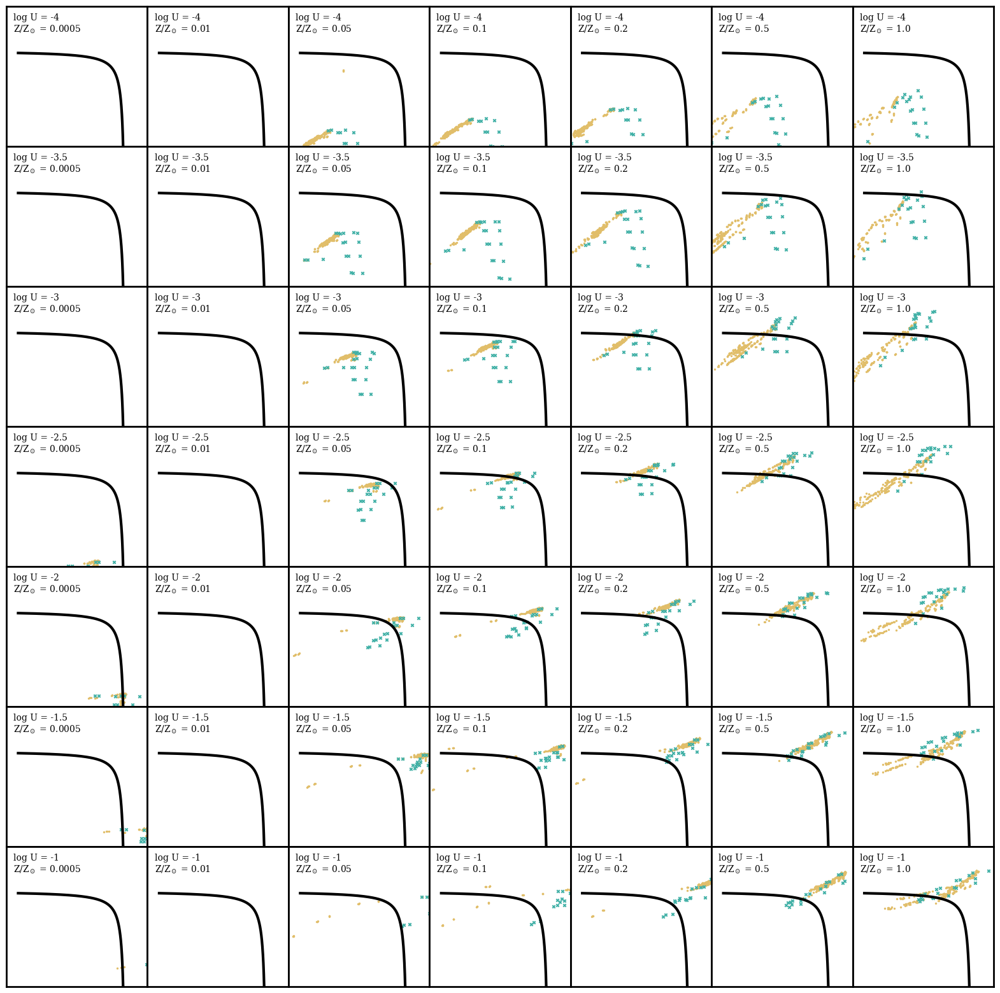

In [58]:
linesdf = pd.read_csv('BPASS_all_solar_models.csv')
AGN_solar = pd.read_csv('AGN_solar.csv')

fig = plt.figure(figsize=(20,20))
gs = GridSpec(nrows=7, ncols=7)
gs.update(wspace=0.0, hspace=0.0)

logU_grid = [-4, -3.5, -3, -2.5, -2, -1.5, -1]
Z_grid = [0.0005, 0.01, 0.05, 0.1, 0.2, 0.5, 1.0]

for i, logU in enumerate(logU_grid):
    for j, Z in enumerate(Z_grid):

        subdf_bpass = linesdf[(linesdf.logU == logU)&(linesdf.zgas == Z)]
        subdf_agn = AGN_solar[(AGN_solar.logU == logU)&(AGN_solar.zgas == Z)]

        ax = fig.add_subplot(gs[i:i+1, j:j+1])
        ax.scatter(np.log10(subdf_bpass['Ne_3_3868.76A']/(subdf_bpass['O_2_3726.03A']+subdf_bpass['O_2_3728.81A'])), np.log10(subdf_bpass['O_3_5006.84A']/subdf_bpass['H_1_4861.33A']), 
           c=COLOR_STARS, alpha=1.0, label='Stars', zorder=-9, s=2)
        ax.scatter(np.log10(subdf_agn['Ne_3_3868.76A']/(subdf_agn['O_2_3726.03A']+subdf_agn['O_2_3728.81A'])), np.log10(subdf_agn['O_3_5006.84A']/subdf_agn['H_1_4861.33A']), 
                c=COLOR_AGN, marker='x', alpha=1.0, label='AGN', zorder=-9, s=10)
        plot_ohno_backhaus_2022(ax)
        ax.set_xlim(-2.25, 0.75)
        ax.set_ylim(-1.75, 1.75)
        ax.tick_params(bottom=False, labelbottom=False, left=False, labelleft=False, which='both')
        ax.annotate(f'log U = {logU}\nZ/Z$_\odot$ = {Z}', (0.05, 0.95), xycoords='axes fraction', ha='left', va='top', fontsize=10)
        # ax.annotate(f'Z/Z$_\odot$ = {Z}', (0.1, 0.9), xycoords='axes fraction')


# plt.xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
# plt.ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')

plt.savefig('ohno_grid.pdf', bbox_inches='tight')
plt.show()

/opt/miniconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


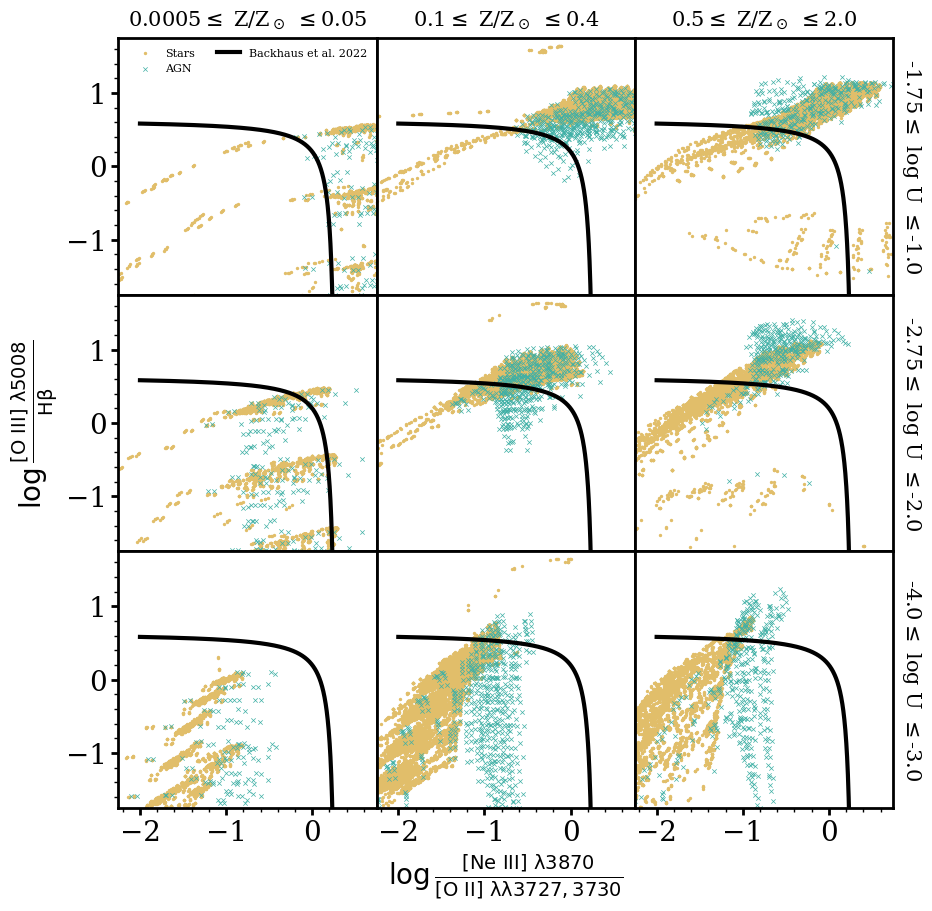

In [73]:
linesdf = pd.read_csv('BPASS_all_solar_models.csv')
AGN_solar = pd.read_csv('AGN_solar.csv')

fig = plt.figure(figsize=(10,10))
gs = GridSpec(nrows=3, ncols=3)
gs.update(wspace=0.0, hspace=0.0)

logU_grid = [[-1.75, -1.5, -1.25, -1.0],
             [-2.75, -2.5, -2.25, -2.0], 
             [-4.0, -3.75, -3.5, -3.25, -3.0]
             ]
Z_grid = [[5.0e-04, 5.0e-03, 5.0e-02], 
          [1.0e-01, 1.5e-01, 2.0e-01, 2.5e-01, 3.0e-01, 4.0e-01], 
          [5.0e-01, 7.0e-01, 1.0e+00, 2.0e+00]]

for i, logU in enumerate(logU_grid):
    for j, Z in enumerate(Z_grid):

        subdf_bpass = linesdf[(linesdf.logU >= logU_grid[i][0])&((linesdf.logU <= logU_grid[i][-1]))&(linesdf.zgas >= Z_grid[j][0])&(linesdf.zgas <= Z_grid[j][-1])]
        subdf_agn = AGN_solar[(AGN_solar.logU >= logU_grid[i][0])&((AGN_solar.logU <= logU_grid[i][-1]))&(AGN_solar.zgas >= Z_grid[j][0])&(AGN_solar.zgas <= Z_grid[j][-1])]

        ax = fig.add_subplot(gs[i:i+1, j:j+1])
        ax.scatter(np.log10(subdf_bpass['Ne_3_3868.76A']/(subdf_bpass['O_2_3726.03A']+subdf_bpass['O_2_3728.81A'])), np.log10(subdf_bpass['O_3_5006.84A']/subdf_bpass['H_1_4861.33A']), 
           c=COLOR_STARS, alpha=1.0, label='Stars', zorder=-9, s=2, rasterized=True)
        ax.scatter(np.log10(subdf_agn['Ne_3_3868.76A']/(subdf_agn['O_2_3726.03A']+subdf_agn['O_2_3728.81A'])), np.log10(subdf_agn['O_3_5006.84A']/subdf_agn['H_1_4861.33A']), 
                c=COLOR_AGN, marker='x', alpha=1.0, label='AGN', lw=0.5, zorder=-9, s=10, rasterized=True)
        plot_ohno_backhaus_2022(ax)
        ax.set_xlim(-2.25, 0.75)
        ax.set_ylim(-1.75, 1.75)
        if i==0 and j==0:
            ax.legend(frameon=False, fontsize=8, ncols=2)
        if i==2 and j==1:
            ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
        if i==1 and j==0:
            ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
        if j!=0:
            ax.tick_params(left=False,labelleft=False, which='both')
        if i == 0:
            ax.annotate(f'{Z_grid[j][0]}$\leq$ Z/Z$_\odot$ $\leq${Z_grid[j][-1]}', (0.5, 1.025), xycoords='axes fraction', ha='center', va='bottom', fontsize=15)
        if j == 2:
            ax.annotate(f'{logU_grid[i][0]}$\leq$ log U $\leq${logU_grid[i][-1]}', (1.025, 0.5), xycoords='axes fraction', ha='left', va='center', fontsize=15, rotation=270)

plt.savefig('ohno_grid.pdf', bbox_inches='tight')
plt.show()

In [75]:
len(linesdf.zstar.unique())

13

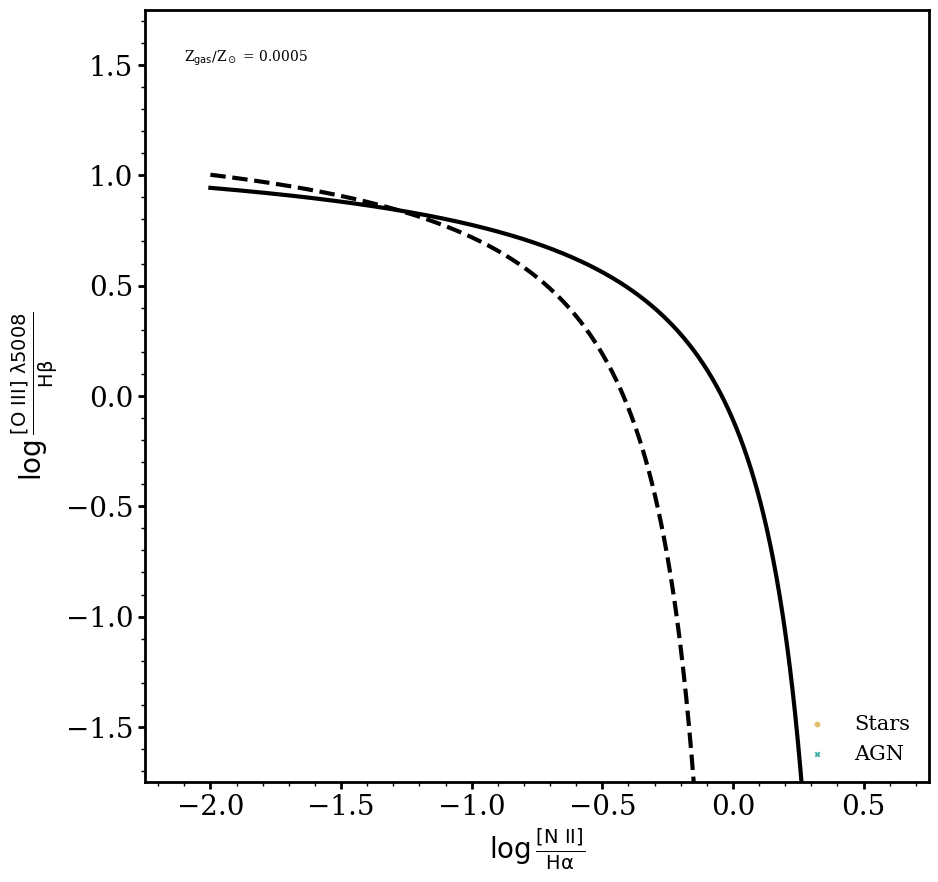

In [80]:
from matplotlib.animation import FuncAnimation
from matplotlib.animation import PillowWriter

linesdf = linesdf[linesdf.age <= 8]

Z_grid = np.sort(linesdf.zgas.unique())

def make_animation_bpt_zgas(Z_grid):
    fig, ax = plt.subplots(1, 1)
    plt.tight_layout()
    fig.set_size_inches(10,10)


    def animate(frame):
        ax.clear()
        zgas = Z_grid[frame]        
        subdf_bpass = linesdf[(linesdf.zgas == zgas)]
        subdf_agn = AGN_solar[(AGN_solar.zgas == zgas)]

        # ax = fig.add_subplot(gs[i:i+1, j:j+1])
        ax.scatter(np.log10(subdf_bpass['N_2_6583.45A']/subdf_bpass['H_1_6562.81A']), np.log10(subdf_bpass['O_3_5006.84A']/subdf_bpass['H_1_4861.33A']), 
                c=COLOR_STARS, alpha=1.0,  zorder=-9,s=10, label='Stars')
        ax.scatter(np.log10(subdf_agn['N_2_6583.45A']/subdf_agn['H_1_6562.81A']), np.log10(subdf_agn['O_3_5006.84A']/subdf_agn['H_1_4861.33A']), 
                c=COLOR_AGN, marker='x', alpha=1.0,  zorder=-9,s=10, label='AGN')
        plot_bpt_kewley_2001(ax, label=False)
        plot_bpt_kauffmann_2003(ax, label=False)
        ax.set_xlim(-2.25, 0.75)
        ax.set_ylim(-1.75, 1.75)
        # ax.tick_params(bottom=False, labelbottom=False, left=False, labelleft=False, which='both')
        ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
        ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
        ax.annotate(f'Z$_\mathrm{{gas}}/$Z$_\odot$ = {zgas}', (0.05, 0.95), xycoords='axes fraction', ha='left', va='top', fontsize=10)
        ax.legend(loc='lower right', fontsize=15, frameon=False)

    ani = FuncAnimation(fig, animate, frames=len(Z_grid),
                        interval=5, repeat=True)
    ani.save('bpt_zgas.gif', dpi=300, writer=PillowWriter(fps=len(Z_grid)/2))

make_animation_bpt_zgas(Z_grid)

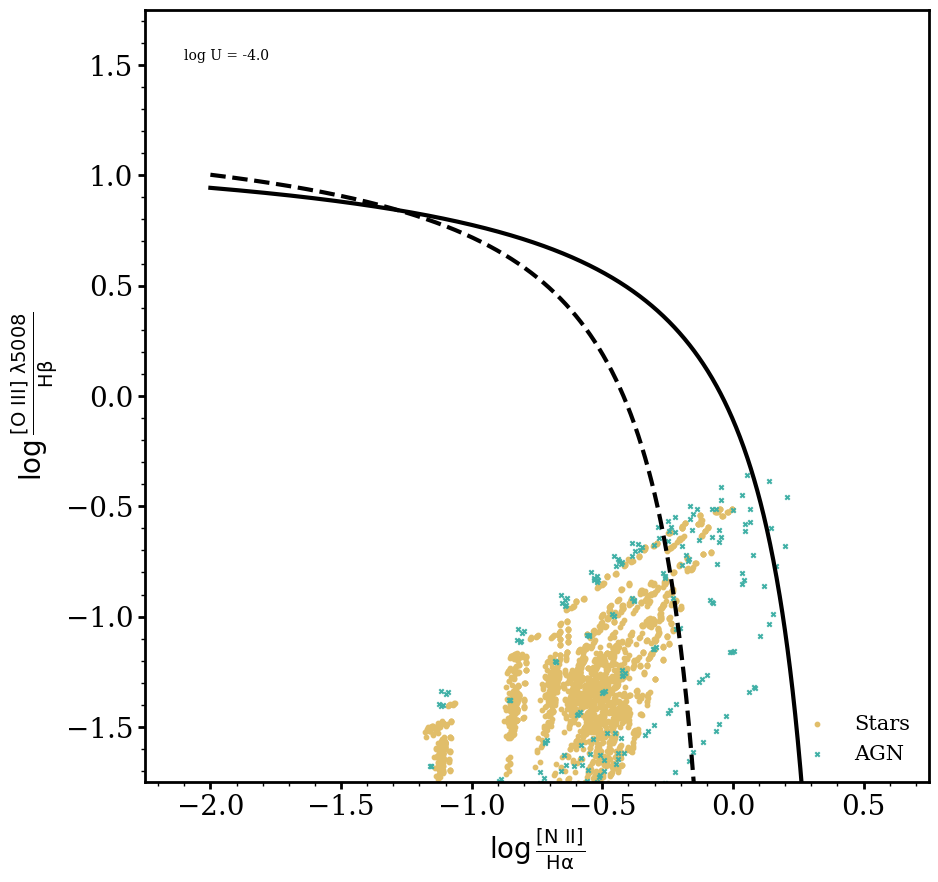

In [85]:
from matplotlib.animation import FuncAnimation
from matplotlib.animation import PillowWriter

linesdf = linesdf[linesdf.age <= 8]
logU_grid = np.arange(-4, -0.75, 0.25)

def make_animation_bpt_logU(logU_grid):
    fig, ax = plt.subplots(1, 1)
    plt.tight_layout()
    fig.set_size_inches(10,10)


    def animate(frame):
        ax.clear()
        logU = logU_grid[frame]        
        subdf_bpass = linesdf[(linesdf.logU == logU)]
        subdf_agn = AGN_solar[(AGN_solar.logU == logU)]

        # ax = fig.add_subplot(gs[i:i+1, j:j+1])
        ax.scatter(np.log10(subdf_bpass['N_2_6583.45A']/subdf_bpass['H_1_6562.81A']), np.log10(subdf_bpass['O_3_5006.84A']/subdf_bpass['H_1_4861.33A']), 
                c=COLOR_STARS, alpha=1.0,  zorder=-9,s=10, label='Stars')
        ax.scatter(np.log10(subdf_agn['N_2_6583.45A']/subdf_agn['H_1_6562.81A']), np.log10(subdf_agn['O_3_5006.84A']/subdf_agn['H_1_4861.33A']), 
                c=COLOR_AGN, marker='x', alpha=1.0,  zorder=-9,s=10, label='AGN')
        plot_bpt_kewley_2001(ax, label=False)
        plot_bpt_kauffmann_2003(ax, label=False)
        ax.set_xlim(-2.25, 0.75)
        ax.set_ylim(-1.75, 1.75)
        # ax.tick_params(bottom=False, labelbottom=False, left=False, labelleft=False, which='both')
        ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
        ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
        ax.annotate(f'log U = {logU}', (0.05, 0.95), xycoords='axes fraction', ha='left', va='top', fontsize=10)
        ax.legend(loc='lower right', fontsize=15, frameon=False)

    ani = FuncAnimation(fig, animate, frames=len(logU_grid),
                        interval=5, repeat=True)
    ani.save('bpt_logU.gif', dpi=300, writer=PillowWriter(fps=len(logU_grid)/2))

make_animation_bpt_logU(logU_grid)

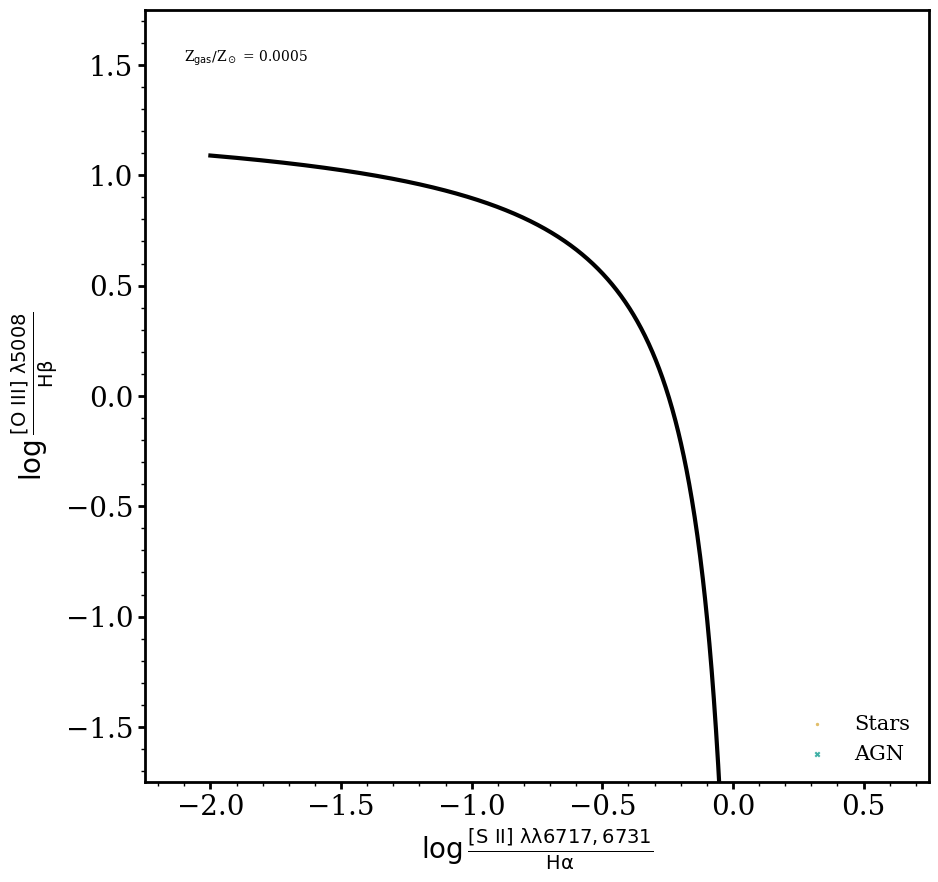

In [81]:
from matplotlib.animation import FuncAnimation
from matplotlib.animation import PillowWriter

linesdf = linesdf[linesdf.age <= 8]

Z_grid = np.sort(linesdf.zgas.unique())

def make_animation_vo87_zgas(Z_grid):
    fig, ax = plt.subplots(1, 1)
    plt.tight_layout()
    fig.set_size_inches(10,10)


    def animate(frame):
        ax.clear()
        zgas = Z_grid[frame]        
        subdf_bpass = linesdf[(linesdf.zgas == zgas)]
        subdf_agn = AGN_solar[(AGN_solar.zgas == zgas)]

        # ax = fig.add_subplot(gs[i:i+1, j:j+1])
        ax.scatter(np.log10((subdf_bpass['S_2_6716.44A']+subdf_bpass['S_2_6730.82A'])/subdf_bpass['H_1_6562.81A']), np.log10(subdf_bpass['O_3_5006.84A']/subdf_bpass['H_1_4861.33A']), 
                   c=COLOR_STARS, alpha=1.0, label='Stars', zorder=-9, s=2)
        ax.scatter(np.log10((subdf_agn['S_2_6716.44A']+subdf_agn['S_2_6730.82A'])/subdf_agn['H_1_6562.81A']), np.log10(subdf_agn['O_3_5006.84A']/subdf_agn['H_1_4861.33A']), 
                   c=COLOR_AGN, marker='x', alpha=1.0, label='AGN', zorder=-9, s=10)
        plot_vo87_trump_2015(ax, label=False)
        ax.set_xlim(-2.25, 0.75)
        ax.set_ylim(-1.75, 1.75)
        # ax.tick_params(bottom=False, labelbottom=False, left=False, labelleft=False, which='both')
        ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
        ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
        ax.annotate(f'Z$_\mathrm{{gas}}/$Z$_\odot$ = {zgas}', (0.05, 0.95), xycoords='axes fraction', ha='left', va='top', fontsize=10)
        ax.legend(loc='lower right', fontsize=15, frameon=False)


    ani = FuncAnimation(fig, animate, frames=len(Z_grid),
                        interval=5, repeat=True)
    ani.save('vo87_zgas.gif', dpi=300, writer=PillowWriter(fps=len(Z_grid)/2))

make_animation_vo87_zgas(Z_grid)

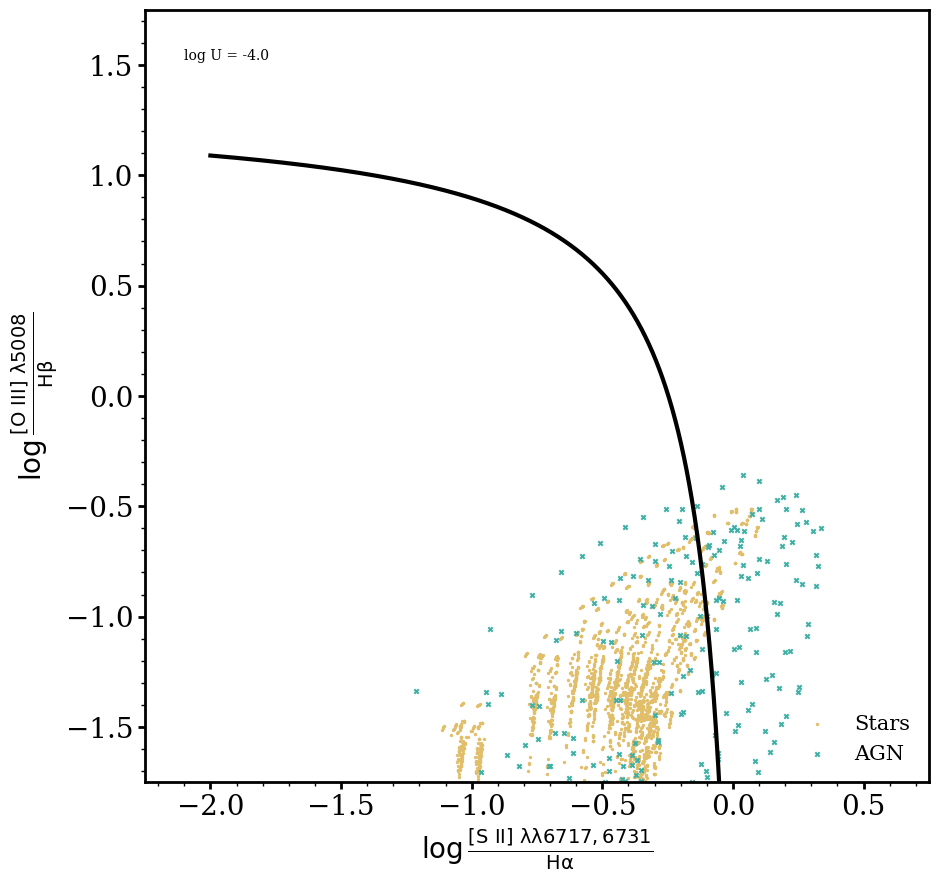

In [83]:
from matplotlib.animation import FuncAnimation
from matplotlib.animation import PillowWriter

linesdf = linesdf[linesdf.age <= 8]
logU_grid = np.arange(-4, -0.75, 0.25)

def make_animation_vo87_logU(logU_grid):
    fig, ax = plt.subplots(1, 1)
    plt.tight_layout()
    fig.set_size_inches(10,10)


    def animate(frame):
        ax.clear()
        logU = logU_grid[frame]        
        subdf_bpass = linesdf[(linesdf.logU == logU)]
        subdf_agn = AGN_solar[(AGN_solar.logU == logU)]

        # ax = fig.add_subplot(gs[i:i+1, j:j+1])
        ax.scatter(np.log10((subdf_bpass['S_2_6716.44A']+subdf_bpass['S_2_6730.82A'])/subdf_bpass['H_1_6562.81A']), np.log10(subdf_bpass['O_3_5006.84A']/subdf_bpass['H_1_4861.33A']), 
                   c=COLOR_STARS, alpha=1.0, label='Stars', zorder=-9, s=2)
        ax.scatter(np.log10((subdf_agn['S_2_6716.44A']+subdf_agn['S_2_6730.82A'])/subdf_agn['H_1_6562.81A']), np.log10(subdf_agn['O_3_5006.84A']/subdf_agn['H_1_4861.33A']), 
                   c=COLOR_AGN, marker='x', alpha=1.0, label='AGN', zorder=-9, s=10)
        plot_vo87_trump_2015(ax, label=False)
        ax.set_xlim(-2.25, 0.75)
        ax.set_ylim(-1.75, 1.75)
        # ax.tick_params(bottom=False, labelbottom=False, left=False, labelleft=False, which='both')
        ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
        ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
        ax.annotate(f'log U = {logU}', (0.05, 0.95), xycoords='axes fraction', ha='left', va='top', fontsize=10)
        ax.legend(loc='lower right', fontsize=15, frameon=False)


    ani = FuncAnimation(fig, animate, frames=len(logU_grid),
                        interval=5, repeat=True)
    ani.save('vo87_logU.gif', dpi=300, writer=PillowWriter(fps=len(logU_grid)/2))

make_animation_vo87_logU(logU_grid)

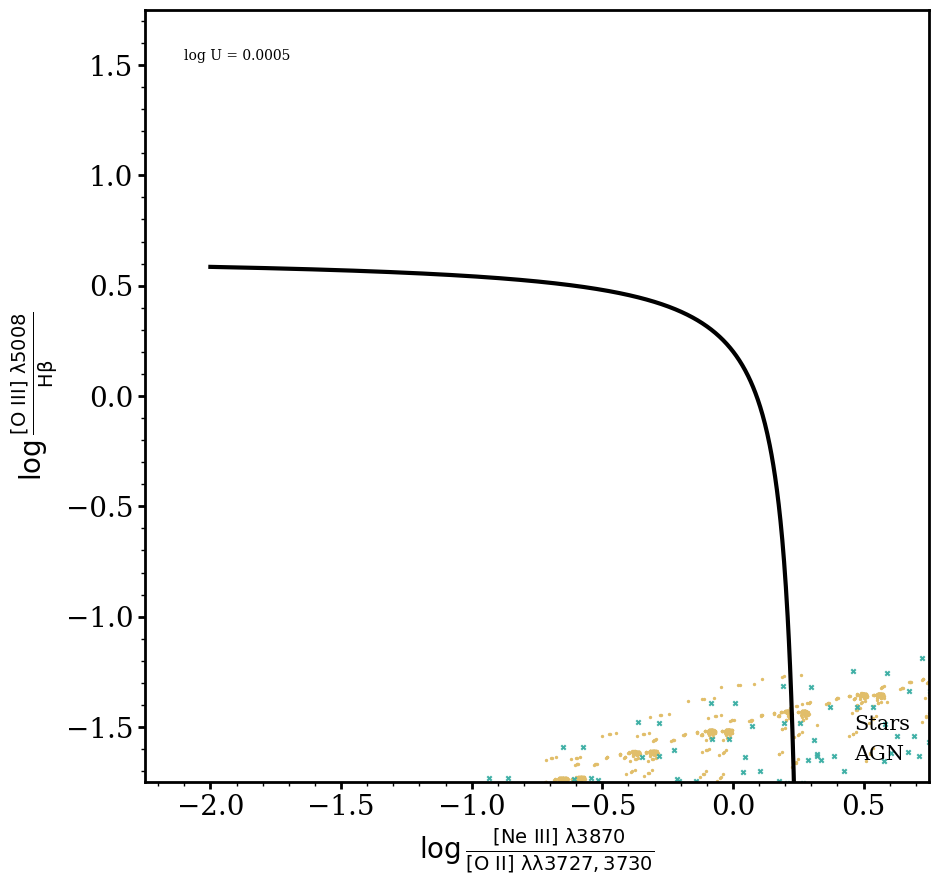

In [82]:
from matplotlib.animation import FuncAnimation
from matplotlib.animation import PillowWriter

linesdf = linesdf[linesdf.age <= 8]

Z_grid = np.sort(linesdf.zgas.unique())

def make_animation_ohno_zgas(Z_grid):
    fig, ax = plt.subplots(1, 1)
    plt.tight_layout()
    fig.set_size_inches(10,10)


    def animate(frame):
        ax.clear()
        zgas = Z_grid[frame]        
        subdf_bpass = linesdf[(linesdf.zgas == zgas)]
        subdf_agn = AGN_solar[(AGN_solar.zgas == zgas)]

        # ax = fig.add_subplot(gs[i:i+1, j:j+1])
        ax.scatter(np.log10(subdf_bpass['Ne_3_3868.76A']/(subdf_bpass['O_2_3726.03A']+subdf_bpass['O_2_3728.81A'])), np.log10(subdf_bpass['O_3_5006.84A']/subdf_bpass['H_1_4861.33A']), 
           c=COLOR_STARS, alpha=1.0, label='Stars', zorder=-9, s=2)
        ax.scatter(np.log10(subdf_agn['Ne_3_3868.76A']/(subdf_agn['O_2_3726.03A']+subdf_agn['O_2_3728.81A'])), np.log10(subdf_agn['O_3_5006.84A']/subdf_agn['H_1_4861.33A']), 
                c=COLOR_AGN, marker='x', alpha=1.0, label='AGN', zorder=-9, s=10)
        plot_ohno_backhaus_2022(ax, label=False)
        ax.set_xlim(-2.25, 0.75)
        ax.set_ylim(-1.75, 1.75)
        # ax.tick_params(bottom=False, labelbottom=False, left=False, labelleft=False, which='both')
        ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
        ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
        ax.annotate(f'log U = {zgas}', (0.05, 0.95), xycoords='axes fraction', ha='left', va='top', fontsize=10)
        ax.legend(loc='lower right', fontsize=15, frameon=False)


    ani = FuncAnimation(fig, animate, frames=len(Z_grid),
                        interval=5, repeat=True)
    ani.save('ohno_zgas.gif', dpi=300, writer=PillowWriter(fps=len(Z_grid)/2))

make_animation_ohno_zgas(Z_grid)

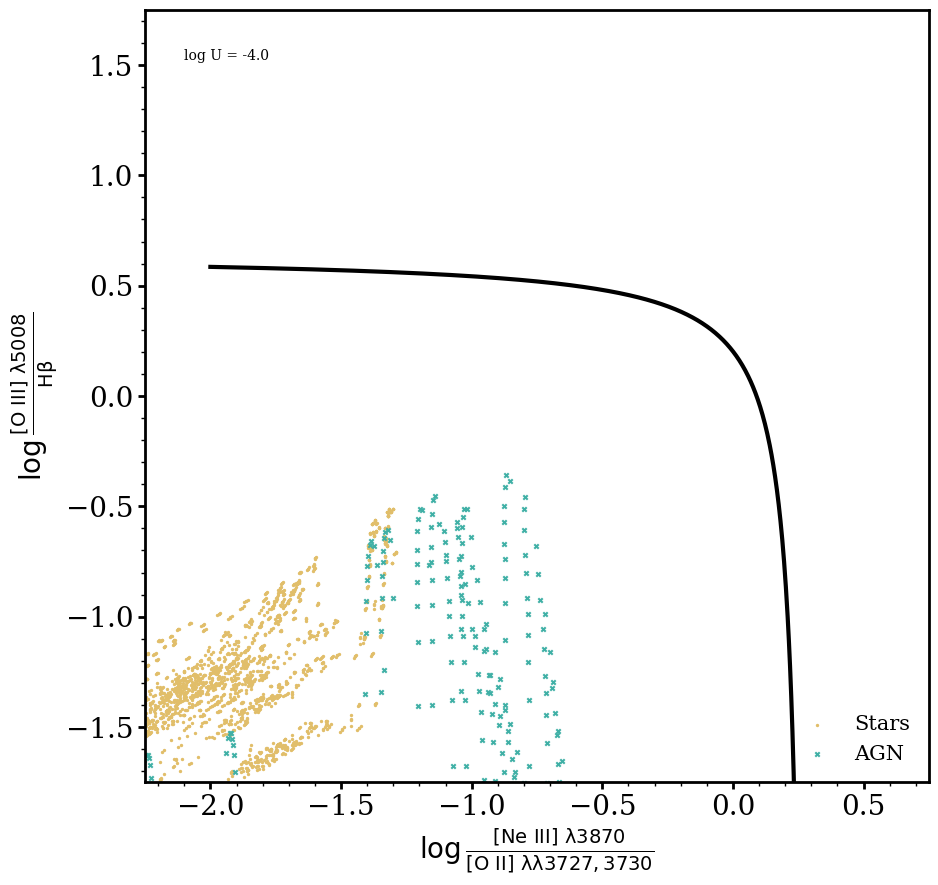

In [84]:
from matplotlib.animation import FuncAnimation
from matplotlib.animation import PillowWriter

linesdf = linesdf[linesdf.age <= 8]
logU_grid = np.arange(-4, -0.75, 0.25)

def make_animation_ohno_logU(logU_grid):
    fig, ax = plt.subplots(1, 1)
    plt.tight_layout()
    fig.set_size_inches(10,10)


    def animate(frame):
        ax.clear()
        logU = logU_grid[frame]        
        subdf_bpass = linesdf[(linesdf.logU == logU)]
        subdf_agn = AGN_solar[(AGN_solar.logU == logU)]

        # ax = fig.add_subplot(gs[i:i+1, j:j+1])
        ax.scatter(np.log10(subdf_bpass['Ne_3_3868.76A']/(subdf_bpass['O_2_3726.03A']+subdf_bpass['O_2_3728.81A'])), np.log10(subdf_bpass['O_3_5006.84A']/subdf_bpass['H_1_4861.33A']), 
           c=COLOR_STARS, alpha=1.0, label='Stars', zorder=-9, s=2)
        ax.scatter(np.log10(subdf_agn['Ne_3_3868.76A']/(subdf_agn['O_2_3726.03A']+subdf_agn['O_2_3728.81A'])), np.log10(subdf_agn['O_3_5006.84A']/subdf_agn['H_1_4861.33A']), 
                c=COLOR_AGN, marker='x', alpha=1.0, label='AGN', zorder=-9, s=10)
        plot_ohno_backhaus_2022(ax, label=False)
        ax.set_xlim(-2.25, 0.75)
        ax.set_ylim(-1.75, 1.75)
        # ax.tick_params(bottom=False, labelbottom=False, left=False, labelleft=False, which='both')
        ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
        ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
        ax.annotate(f'log U = {logU}', (0.05, 0.95), xycoords='axes fraction', ha='left', va='top', fontsize=10)
        ax.legend(loc='lower right', fontsize=15, frameon=False)


    ani = FuncAnimation(fig, animate, frames=len(logU_grid),
                        interval=5, repeat=True)
    ani.save('ohno_logU.gif', dpi=300, writer=PillowWriter(fps=len(logU_grid)/2))

make_animation_ohno_logU(logU_grid)

In [ ]:
logU_grid = [-4, -3.5, -3, -2.5, -2, -1.5, -1]
Z_grid = [0.0005, 0.01, 0.05, 0.1, 0.2, 0.5, 1.0]

for i, logU in enumerate(logU_grid):
    for j, Z in enumerate(Z_grid):

        subdf_bpass = linesdf[(linesdf.logU == logU)&(linesdf.zgas == Z)]
        subdf_agn = AGN_solar[(AGN_solar.logU == logU)&(AGN_solar.zgas == Z)]

        ax = fig.add_subplot(gs[i:i+1, j:j+1])
        ax.scatter(np.log10(subdf_bpass['N_2_6583.45A']/subdf_bpass['H_1_6562.81A']), np.log10(subdf_bpass['O_3_5006.84A']/subdf_bpass['H_1_4861.33A']), 
                c=COLOR_STARS, alpha=1.0,  zorder=-9,s=3)
        ax.scatter(np.log10(subdf_agn['N_2_6583.45A']/subdf_agn['H_1_6562.81A']), np.log10(subdf_agn['O_3_5006.84A']/subdf_agn['H_1_4861.33A']), 
                c=COLOR_AGN, marker='x', alpha=1.0,  zorder=-9,s=3)
        plot_bpt_kewley_2001(ax, label=True)
        plot_bpt_kauffmann_2003(ax, label=True)
        ax.set_xlim(-2.25, 0.75)
        ax.set_ylim(-1.75, 1.75)
        ax.tick_params(bottom=False, labelbottom=False, left=False, labelleft=False, which='both')
        ax.annotate(f'log U = {logU}\nZ/Z$_\odot$ = {Z}', (0.05, 0.95), xycoords='axes fraction', ha='left', va='top', fontsize=10)

In [9]:
np.arange(-4, -0.75, 0.25)

array([-4.  , -3.75, -3.5 , -3.25, -3.  , -2.75, -2.5 , -2.25, -2.  ,
       -1.75, -1.5 , -1.25, -1.  ])